## Train model for all subjects

In [1]:
model_name = 'DWTs'

### Import libraries

In [2]:
import numpy as np
import scipy
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV, cross_validate
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.preprocessing import StandardScaler, OneHotEncoder

from sklearn.model_selection import train_test_split, GridSearchCV, cross_validate
from sklearn.feature_selection import mutual_info_classif


from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_auc_score, log_loss
from sklearn.model_selection import cross_validate

from matplotlib.colors import LinearSegmentedColormap
from mne import create_info
from mne.viz import plot_topomap

### Import data

In [3]:
filename = '/mnt/d/sharegit/MasterThesis_data/'+ model_name +'/pp01_t16.csv'
df = pd.read_csv(filename, header=None)

### Prepare Data

In [4]:
df.replace([np.inf, -np.inf], np.nan, inplace=True)

channels = ['Fp1', 'Fp2', 'F3', 'F4', 'C3', 'C4', 'P3', 'P4', 'O1', 'O2', 'F7', 'F8', 'T7', 'T8', 'P7', 'P8', 'Fz', 'Cz', 'Pz', 'AFz', 'CPz', 'POz']
patterns = ['_d1', '_d2', '_d3', '_d4', '_d5', '_a1']
column_names = ['channels', 'ID', 'Class', 'Epoch'] + [f'{ch}{pt}' for ch in channels for pt in patterns]

if len(column_names) != len(df.columns):
    raise ValueError(f"Number of column names ({len(column_names)}) does not match number of columns in DataFrame ({len(df.columns)})")

df.columns = column_names
df.head()

,channels,ID,Class,Epoch,Fp1_d1,Fp1_d2,Fp1_d3,Fp1_d4,Fp1_d5,Fp1_a1,...,CPz_d3,CPz_d4,CPz_d5,CPz_a1,POz_d1,POz_d2,POz_d3,POz_d4,POz_d5,POz_a1
0,5,1,1,1,0.575075,0.136032,0.123487,0.093560,0.057901,0.013945,...,0.140594,0.042888,0.025799,0.006609,0.336483,0.220715,0.231677,0.101612,0.089528,0.019985
1,5,1,1,2,0.509184,0.262941,0.106593,0.072962,0.037227,0.011093,...,0.163608,0.041396,0.009745,0.001428,0.244889,0.384025,0.221724,0.070184,0.060243,0.018934
2,5,1,1,3,0.490340,0.191802,0.204283,0.070682,0.033491,0.009402,...,0.218914,0.044268,0.010597,0.001778,0.273779,0.215197,0.395480,0.070791,0.033080,0.011673
3,5,1,1,4,0.436777,0.235945,0.218578,0.060795,0.038248,0.009657,...,0.273868,0.036003,0.010619,0.001746,0.369812,0.265958,0.274095,0.053359,0.028603,0.008174
4,5,1,1,5,0.398432,0.307515,0.197477,0.053886,0.033593,0.009097,...,0.303220,0.038299,0.007286,0.001249,0.214284,0.327662,0.322558,0.071483,0.049477,0.014537


### Load data into data_array

In [5]:
def load_IDs(df, IDs,types,mod):
    df = df[df['Class'].isin(types)]
    
    class_mapping = dict(zip(types, mod))
    df['Class'] = df['Class'].map(class_mapping)
    
    # Filter the dataframe for the provided IDs
    df = df[df['ID'].isin(IDs)]
    
    # Drop unnecessary columns
    df = df.drop(columns=['channels', 'ID', 'Epoch'])
    
    # Prepare data and labels
    data_array = df.drop(['Class'], axis=1).values
    class_labels = df['Class'].values
    
    # Split the data into training and test sets
    X_train, X_test, y_train, y_test = train_test_split(data_array, class_labels, test_size=0.2, random_state=42)
    print(df.shape[0])
    return X_train, X_test, y_train, y_test
    
# Example usage
types = [9,10,11,12]
mod = ['I1','I2','I3','I4']
IDs = range(1, 35)
X_train, X_test, y_train, y_test = load_IDs(df, IDs,types,mod)

2661


/tmp/ipykernel_180521/1315560365.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)


In [6]:
print(set(IDs))

{1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34}


### Train models

In [7]:
def print_scores(name, scores):
    mean_test_accuracy = np.mean(scores['test_accuracy']) * 100
    std_test_accuracy = np.std(scores['test_accuracy']) * 100
    mean_test_precision = np.mean(scores['test_precision_macro'])
    mean_test_recall = np.mean(scores['test_recall_macro'])
    mean_test_f1 = np.mean(scores['test_f1_macro'])
    mean_test_roc_auc = np.mean(scores['test_roc_auc_ovr'])
    
    print(f"------------------------------------------------------------")
    print(f"Average K-Fold Test Accuracy of {name}: {mean_test_accuracy:.2f}%")
    print(f"Std Dev of K-Fold Test Accuracy of {name}: {std_test_accuracy:.2f}%")
    print(f"Average K-Fold Test Precision of {name}: {mean_test_precision:.2f}")
    print(f"Average K-Fold Test Recall of {name}: {mean_test_recall:.2f}")
    print(f"Average K-Fold Test F1 Score of {name}: {mean_test_f1:.2f}")
    print(f"Average K-Fold Test ROC AUC of {name}: {mean_test_roc_auc:.2f}")
    print(f"------------------------------------------------------------")
    
def RForest_train(X_train, y_train, n_estimators=100, max_depth=None, min_samples_split=2, min_samples_leaf=1, max_features='sqrt', validation='standard', cv=5, echo=True):
    model = RandomForestClassifier(n_estimators=n_estimators, max_depth=max_depth,
                                      min_samples_split=min_samples_split, min_samples_leaf=min_samples_leaf,
                                      max_features=max_features, random_state=42)
    
    scoring = ['accuracy', 'precision_macro', 'recall_macro', 'f1_macro', 'roc_auc_ovr']
    scores = cross_validate(model, X_train, y_train, cv=cv, scoring=scoring, return_train_score=True)

    model.fit(X_train, y_train)
    
    if echo:
        print_scores('Random Forest', scores)
    return scores, model


def KNN_train(X_train, y_train, hot_encode=False, n_neighbors=20, p=1, weights='distance', leaf_size=20, algorithm='auto', validation='standard', cv=5, echo=True):
    model = KNeighborsClassifier(n_neighbors=n_neighbors, p=p, weights=weights, leaf_size=leaf_size, algorithm=algorithm)

    scoring = ['accuracy', 'precision_macro', 'recall_macro', 'f1_macro', 'roc_auc_ovr']
    scores = cross_validate(model, X_train, y_train, cv=cv, scoring=scoring, return_train_score=True)
    
    model.fit(X_train, y_train)
    
    if echo:
        print_scores('KNN', scores)
    return scores, model


def MLP_train(X_train, y_train,  hot_encode=False, hidden_layer_sizes=(100,), activation='relu', solver='adam', validation='standard', alpha=0.001, cv=5, max_iter=200, echo=True):
    model = MLPClassifier(hidden_layer_sizes=hidden_layer_sizes, activation=activation, solver=solver, alpha=alpha, batch_size='auto', learning_rate='constant', 
                              learning_rate_init=0.001, power_t=0.5, max_iter=max_iter, shuffle=True, random_state=None, tol=0.0001, verbose=False, 
                              warm_start=False, momentum=0.9, nesterovs_momentum=True, early_stopping=False, validation_fraction=0.1, beta_1=0.9, 
                              beta_2=0.999, epsilon=1e-08, n_iter_no_change=10, max_fun=15000)

    scoring = ['accuracy', 'precision_macro', 'recall_macro', 'f1_macro', 'roc_auc_ovr']
    scores = cross_validate(model,X_train, y_train, cv=cv, scoring=scoring, return_train_score=True)
    
    model.fit(X_train, y_train)

    if echo:
        print_scores('MLP', scores)
    return scores, model

def train_all(X_train, y_train):

    models = []
    scores = []
    
    score, model = KNN_train(X_train, y_train, cv = 10)
    models.append(model)
    scores.append(score)
    
    score, model =RForest_train(X_train, y_train,  cv = 10)
    models.append(model)
    scores.append(score)
    
    score, model = MLP_train(X_train, y_train, hidden_layer_sizes=(200, 100, 50), max_iter=10000, alpha=0.001, cv=10)
    models.append(model)
    scores.append(score)
    
    return models, scores

models,scores = train_all(X_train, y_train)

------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 33.41%
Std Dev of K-Fold Test Accuracy of KNN: 3.39%
Average K-Fold Test Precision of KNN: 0.33
Average K-Fold Test Recall of KNN: 0.33
Average K-Fold Test F1 Score of KNN: 0.33
Average K-Fold Test ROC AUC of KNN: 0.61
------------------------------------------------------------
------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 39.90%
Std Dev of K-Fold Test Accuracy of Random Forest: 4.62%
Average K-Fold Test Precision of Random Forest: 0.40
Average K-Fold Test Recall of Random Forest: 0.40
Average K-Fold Test F1 Score of Random Forest: 0.40
Average K-Fold Test ROC AUC of Random Forest: 0.66
------------------------------------------------------------
------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 40.88%
Std Dev of K-Fold Test Accuracy of MLP: 2.30%
Average K-Fold Test Precision of 

In [8]:
from sklearn.preprocessing import LabelEncoder
from scipy.stats import mode

def calculate_acc(y_test_encoded, models):
    ensemble_preds = np.zeros((len(y_test_encoded), len(models)))
    accs = []
    # Loop over each model to get predictions and calculate individual accuracies
    for i, (model, name) in enumerate(zip(models, ['KNN', 'Random Forest','MLP'])):
        pred = model.predict(X_test)
        
        # Convert string predictions to numerical form
        pred_encoded = le.transform(pred)
        
        acc = np.mean(pred_encoded == y_test_encoded)
        accs.append(acc)
        print(f"{name} Classification Accuracy: {acc}")
        
        # Store the numerical predictions for ensemble averaging
        ensemble_preds[:, i] = pred_encoded

    # Average the predictions (using mode here for classification)
    ensemble_final_preds_encoded = mode(ensemble_preds, axis=1)[0].flatten()
    
    # Convert numerical predictions back to string labels
    ensemble_final_preds = le.inverse_transform(ensemble_final_preds_encoded.astype(int))
    
    # Calculate the ensemble accuracy
    ensemble_acc = np.mean(ensemble_final_preds == y_test)
    print(f"Ensemble Classification Accuracy: {ensemble_acc}")
    return accs, ensemble_preds
le = LabelEncoder()
y_test_encoded = le.fit_transform(y_test)
accs,ensemble_preds = calculate_acc(y_test_encoded, models)

KNN Classification Accuracy: 0.3151969981238274
Random Forest Classification Accuracy: 0.34146341463414637
MLP Classification Accuracy: 0.3714821763602251
Ensemble Classification Accuracy: 0.3602251407129456


In [9]:
print(accs[1])

0.34146341463414637


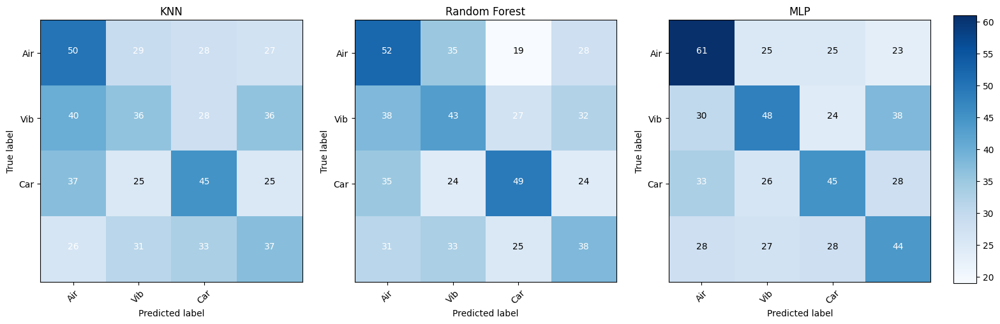

In [10]:
import itertools
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import seaborn as sns  # For enhanced confusion matrix visualization

def plot_confusion_matrix(ax, cm, classes, title, vmin, vmax):
    im = ax.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues, vmin=vmin, vmax=vmax)
    ax.set_title(title)
    tick_marks = range(len(classes))
    ax.set_xticks(tick_marks)
    ax.set_xticklabels(classes, rotation=45)
    ax.set_yticks(tick_marks)
    ax.set_yticklabels(classes)

    fmt = 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        ax.text(j, i, format(cm[i, j], fmt),
                horizontalalignment="center",
                color="white" if cm[i, j] > thresh else "black")

    ax.set_ylabel('True label')
    ax.set_xlabel('Predicted label')

def plot_all_cm(y_test_encoded, ensemble_preds, names):
    # Compute confusion matrices
    cm_knn = confusion_matrix(y_test_encoded, ensemble_preds[:, 0])
    cm_rf = confusion_matrix(y_test_encoded, ensemble_preds[:, 1])
    cm_mlp = confusion_matrix(y_test_encoded, ensemble_preds[:, 2])
    
    # Find the global vmin and vmax for all confusion matrices
    all_cms = [cm_knn, cm_rf, cm_mlp]
    vmin = min(cm.min() for cm in all_cms)
    vmax = max(cm.max() for cm in all_cms)
    
    # Create subplots
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    
    # Plot each confusion matrix with shared vmin and vmax
    plot_confusion_matrix(axes[0], cm_knn, names, 'KNN', vmin, vmax)
    plot_confusion_matrix(axes[1], cm_rf, names, 'Random Forest', vmin, vmax)
    plot_confusion_matrix(axes[2], cm_mlp, names, 'MLP', vmin, vmax)
    
    # Create a single color bar
    cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
    plt.colorbar(axes[0].images[0], cax=cbar_ax)
    plt.show()
names = ['Air','Vib','Car']
plot_all_cm(y_test_encoded, ensemble_preds, names)


## Features Selection

### Colormap and functions definition

In [11]:
import seaborn as sns
import os
# Define the custom colormap
cdict = {
    'red':   [(0.0, 0.0, 0.0),
              (0.33, 0.0, 0.0),
              (0.66, 1.0, 1.0),
              (1.0, 1.0, 1.0)],
    'green': [(0.0, 0.3, 0.3),  # Start with a slight green to make the blue lighter
              (0.33, 1.0, 1.0),
              (0.66, 1.0, 1.0),
              (1.0, 0.0, 0.0)],
    'blue':  [(0.0, 0.9, 0.9),  # Ensure the blue starts at full intensity but is mixed with green
              (0.33, 1.0, 1.0),
              (0.66, 0.0, 0.0),
              (1.0, 0.0, 0.0)]
}

custom_cmap = LinearSegmentedColormap('CustomJet', segmentdata=cdict, N=256)

def get_mutualInfo(X_train, y_train):
    mutual_info_scores = mutual_info_classif(X_train, y_train)
    selected_features = np.where(mutual_info_scores > 0)[0]
    
    X_train_sf = X_train[:, selected_features]
    X_test_sf = X_test[:, selected_features]

    channels = ['Fp1', 'Fp2', 'F3', 'F4', 'C3', 'C4', 'P3', 'P4', 'O1', 'O2', 'F7', 'F8', 'T7', 'T8', 'P7', 'P8', 'Fz', 'Cz', 'Pz', 'AFz', 'CPz', 'POz']
    patterns = ['d1', 'd2', 'd3', 'd4', 'd5', 'a1']
    feature_names = [f'{ch}_{pt}' for ch in channels for pt in patterns]
    
    scores_matrix = mutual_info_scores.reshape(len(channels), len(patterns))
    
    #print(f"Number of features selected: {len(selected_features)}")
    return scores_matrix,X_train_sf,X_test_sf
    
def plot_matrix_MI(X_train, y_train, custom_cmap, save = False, model_name = '',fig_name= ''):
    channels = ['Fp1', 'Fp2', 'F3', 'F4', 'C3', 'C4', 'P3', 'P4', 'O1', 'O2', 'F7', 'F8', 'T7', 'T8', 'P7', 'P8', 'Fz', 'Cz', 'Pz', 'AFz', 'CPz', 'POz']
    patterns = ['d1', 'd2', 'd3', 'd4', 'd5', 'a1']
    feature_names = [f'{ch}_{pt}' for ch in channels for pt in patterns]
    
    scores_matrix,X_train_sf,X_test_sf = get_mutualInfo(X_train, y_train)
    scores_df = pd.DataFrame(scores_matrix, index=channels, columns=patterns)
    plt.figure(figsize=(10, 8))
    sns.heatmap(scores_df, annot=True, fmt=".3f", cmap=custom_cmap)
    plt.title('Heatmap of Mutual Information Scores')
    plt.xlabel('Patterns')
    plt.ylabel('Channels')
    plt.show()
    if save:
        plt.savefig(f'/mnt/d/sharegit/MasterThesis_data/{model_name}/{fig_name}.png')
    
def plot_topoplot(X_train, y_train, info,custom_cmap,save = False, model_name = '',fig_name= ''):

    channels = ['Fp1', 'Fp2', 'F3', 'F4', 'C3', 'C4', 'P3', 'P4', 'O1', 'O2', 'F7', 'F8', 'T7', 'T8', 'P7', 'P8', 'Fz', 'Cz', 'Pz', 'AFz', 'CPz', 'POz']
    patterns = ['d1', 'd2', 'd3', 'd4', 'd5', 'a1']
    feature_names = [f'{ch}_{pt}' for ch in channels for pt in patterns]

    scores_matrix,X_train_sf,X_test_sf = get_mutualInfo(X_train, y_train)
    vmin, vmax = 0, np.max(scores_matrix)*1.1   
    fig, axes = plt.subplots(1, 6, figsize=(18, 10))  # Adjusting the figsize for better visualization
    for i, pattern in enumerate(patterns):
        data = scores_matrix[:, i]
        im, _ = plot_topomap(data, info, axes=axes[i], show=False, cmap=custom_cmap, names=channels, vlim=(vmin, vmax))
        axes[i].set_title(f'{pattern}')
    
    # Adding colorbar
    cbar = fig.colorbar(im, ax=axes.ravel().tolist(), orientation='horizontal', fraction=0.02, pad=0.04)
    cbar.set_label('Mutual information (bits)')
    
    if save:
        save_path = f'/mnt/d/sharegit/MasterThesis_data/{model_name}'
        if not os.path.exists(save_path):
            os.makedirs(save_path)
        plt.savefig(os.path.join(save_path, f'{fig_name}.png'))
    
    plt.show()  # Show the plot after saving
 

### Plot Matrix Mutual information

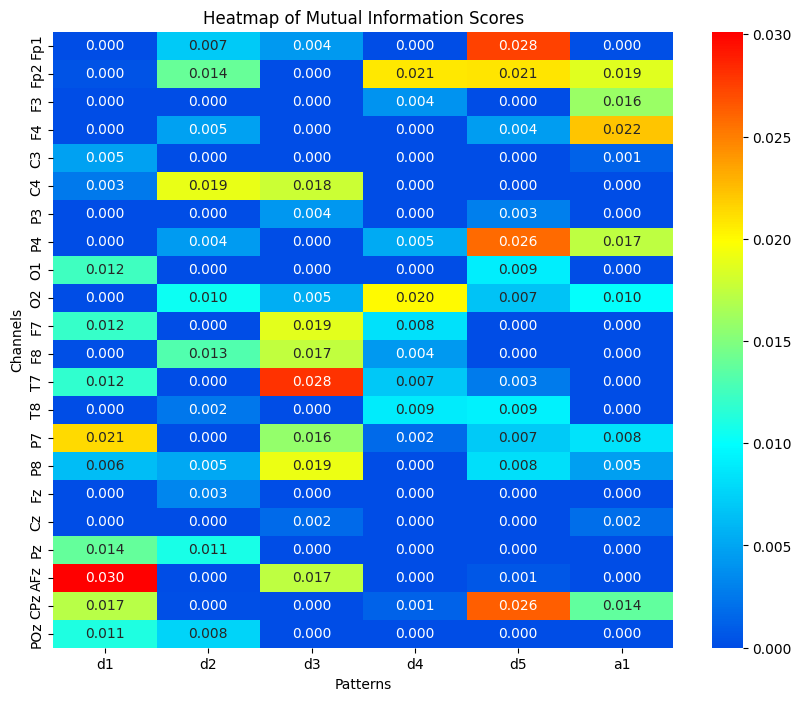

<Figure size 640x480 with 0 Axes>

In [12]:
plot_matrix_MI(X_train, y_train, custom_cmap,save = True, model_name = model_name, fig_name = 'all_subs_confmat')

### Plot as channel location 

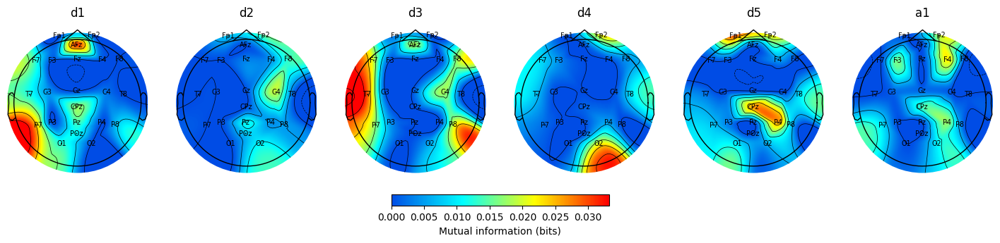

In [13]:
# Load theta and phi values from the provided image
channels = ['Fp1', 'Fp2', 'F3', 'F4', 'C3', 'C4', 'P3', 'P4', 'O1', 'O2', 'F7', 'F8', 'T7', 'T8', 'P7', 'P8', 'Fz', 'Cz', 'Pz', 'AFz', 'CPz', 'POz']

# Create info structure
info = create_info(channels, sfreq=250, ch_types='eeg')
info.set_montage(montage = "standard_1020",match_alias = True)

plot_topoplot(X_train, y_train, info, custom_cmap,save = True,  model_name = model_name, fig_name = 'all_subs_topoplot')


## Summarized analysis

### Initialize parameters

In [14]:
# Initialize the LabelEncoder
le = LabelEncoder()

# Create info structure
channels = ['Fp1', 'Fp2', 'F3', 'F4', 'C3', 'C4', 'P3', 'P4', 'O1', 'O2', 'F7', 'F8', 'T7', 'T8', 'P7', 'P8', 'Fz', 'Cz', 'Pz', 'AFz', 'CPz', 'POz']
info = create_info(channels, sfreq=250, ch_types='eeg')
info.set_montage(montage="standard_1020", match_alias=True)

# Initialize the DataFrame list for storing results
df_ids_list = []

### Train models for each subjects

/tmp/ipykernel_180521/1315560365.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  warnings.warn(
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages

59
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 34.00%
Std Dev of K-Fold Test Accuracy of KNN: 20.47%
Average K-Fold Test Precision of KNN: 0.23
Average K-Fold Test Recall of KNN: 0.30
Average K-Fold Test F1 Score of KNN: 0.23
Average K-Fold Test ROC AUC of KNN: nan
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 21.50%
Std Dev of K-Fold Test Accuracy of Random Forest: 11.41%
Average K-Fold Test Precision of Random Forest: 0.13
Average K-Fold Test Recall of Random Forest: 0.20
Average K-Fold Test F1 Score of Random Forest: 0.15
Average K-Fold Test ROC AUC of Random Forest: nan
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 19.00%
Std Dev of K-Fold Test Accuracy of MLP: 20.22%
Average K-Fold Test Precision of MLP: 0.11
Average K-Fold Test Recall of MLP: 0.18
Average K-Fold Test F1 Score of MLP: 0.13
Average K-Fold Test ROC AUC of MLP: nan
------------------------------------------------------------
KNN Classification Accuracy: 0.08333333333333333
Random Forest Classification Accuracy: 0.3333333333333333
MLP Classification Accuracy: 0.3333333333333333
Ensemble Classification Accuracy: 0.3333333333333333


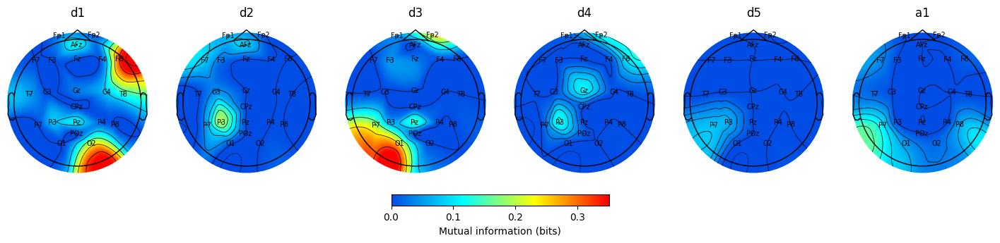

/tmp/ipykernel_180521/1315560365.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

80
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 42.62%
Std Dev of K-Fold Test Accuracy of KNN: 23.36%
Average K-Fold Test Precision of KNN: 0.36
Average K-Fold Test Recall of KNN: 0.44
Average K-Fold Test F1 Score of KNN: 0.36
Average K-Fold Test ROC AUC of KNN: 0.68
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 39.29%
Std Dev of K-Fold Test Accuracy of Random Forest: 24.36%
Average K-Fold Test Precision of Random Forest: 0.40
Average K-Fold Test Recall of Random Forest: 0.41
Average K-Fold Test F1 Score of Random Forest: 0.38
Average K-Fold Test ROC AUC of Random Forest: 0.73
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 41.19%
Std Dev of K-Fold Test Accuracy of MLP: 20.57%
Average K-Fold Test Precision of MLP: 0.40
Average K-Fold Test Recall of MLP: 0.40
Average K-Fold Test F1 Score of MLP: 0.38
Average K-Fold Test ROC AUC of MLP: 0.69
------------------------------------------------------------
KNN Classification Accuracy: 0.375
Random Forest Classification Accuracy: 0.4375
MLP Classification Accuracy: 0.375
Ensemble Classification Accuracy: 0.5


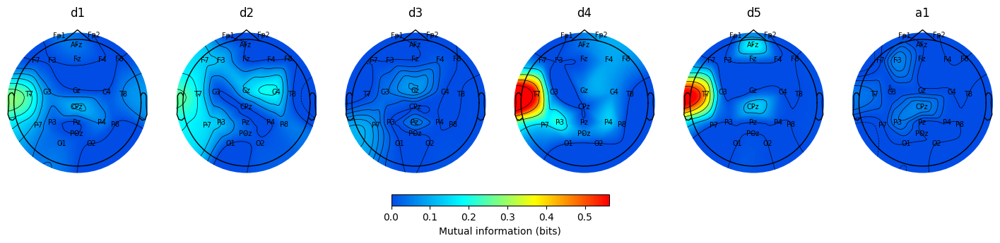

/tmp/ipykernel_180521/1315560365.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

80
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 53.81%
Std Dev of K-Fold Test Accuracy of KNN: 12.56%
Average K-Fold Test Precision of KNN: 0.51
Average K-Fold Test Recall of KNN: 0.56
Average K-Fold Test F1 Score of KNN: 0.51
Average K-Fold Test ROC AUC of KNN: 0.76
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 65.95%
Std Dev of K-Fold Test Accuracy of Random Forest: 9.88%
Average K-Fold Test Precision of Random Forest: 0.64
Average K-Fold Test Recall of Random Forest: 0.65
Average K-Fold Test F1 Score of Random Forest: 0.61
Average K-Fold Test ROC AUC of Random Forest: 0.85
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 52.38%
Std Dev of K-Fold Test Accuracy of MLP: 16.22%
Average K-Fold Test Precision of MLP: 0.47
Average K-Fold Test Recall of MLP: 0.54
Average K-Fold Test F1 Score of MLP: 0.48
Average K-Fold Test ROC AUC of MLP: 0.76
------------------------------------------------------------
KNN Classification Accuracy: 0.3125
Random Forest Classification Accuracy: 0.625
MLP Classification Accuracy: 0.625
Ensemble Classification Accuracy: 0.5625


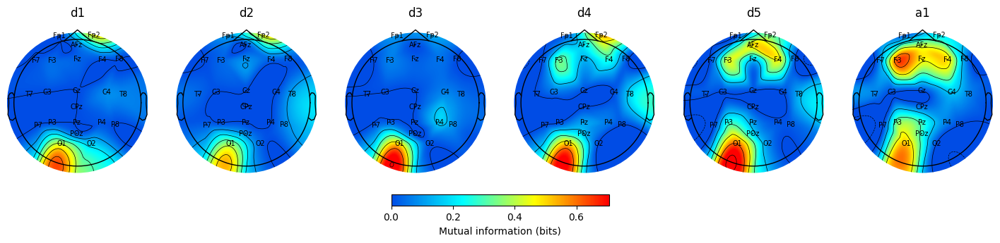

/tmp/ipykernel_180521/1315560365.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

80
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 35.95%
Std Dev of K-Fold Test Accuracy of KNN: 17.08%
Average K-Fold Test Precision of KNN: 0.29
Average K-Fold Test Recall of KNN: 0.34
Average K-Fold Test F1 Score of KNN: 0.28
Average K-Fold Test ROC AUC of KNN: 0.64
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 65.24%
Std Dev of K-Fold Test Accuracy of Random Forest: 10.17%
Average K-Fold Test Precision of Random Forest: 0.60
Average K-Fold Test Recall of Random Forest: 0.68
Average K-Fold Test F1 Score of Random Forest: 0.61
Average K-Fold Test ROC AUC of Random Forest: 0.90
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 58.81%
Std Dev of K-Fold Test Accuracy of MLP: 23.11%
Average K-Fold Test Precision of MLP: 0.53
Average K-Fold Test Recall of MLP: 0.55
Average K-Fold Test F1 Score of MLP: 0.51
Average K-Fold Test ROC AUC of MLP: 0.73
------------------------------------------------------------
KNN Classification Accuracy: 0.375
Random Forest Classification Accuracy: 0.8125
MLP Classification Accuracy: 0.4375
Ensemble Classification Accuracy: 0.5625


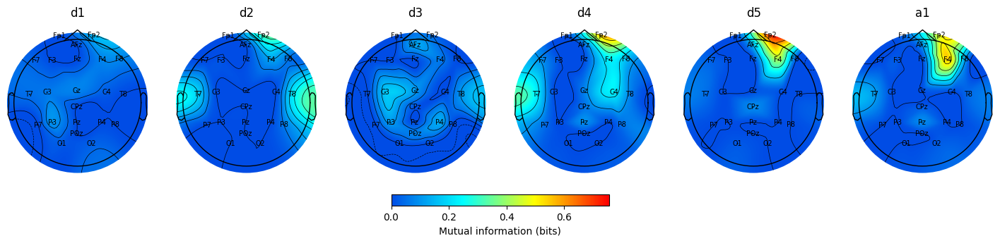

/tmp/ipykernel_180521/1315560365.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

72
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 58.67%
Std Dev of K-Fold Test Accuracy of KNN: 20.50%
Average K-Fold Test Precision of KNN: 0.52
Average K-Fold Test Recall of KNN: 0.60
Average K-Fold Test F1 Score of KNN: 0.52
Average K-Fold Test ROC AUC of KNN: 0.86
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 87.67%
Std Dev of K-Fold Test Accuracy of Random Forest: 11.06%
Average K-Fold Test Precision of Random Forest: 0.80
Average K-Fold Test Recall of Random Forest: 0.86
Average K-Fold Test F1 Score of Random Forest: 0.82
Average K-Fold Test ROC AUC of Random Forest: 0.96
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 81.00%
Std Dev of K-Fold Test Accuracy of MLP: 8.95%
Average K-Fold Test Precision of MLP: 0.72
Average K-Fold Test Recall of MLP: 0.79
Average K-Fold Test F1 Score of MLP: 0.73
Average K-Fold Test ROC AUC of MLP: 0.96
------------------------------------------------------------
KNN Classification Accuracy: 0.6
Random Forest Classification Accuracy: 0.8666666666666667
MLP Classification Accuracy: 0.8666666666666667
Ensemble Classification Accuracy: 0.8666666666666667


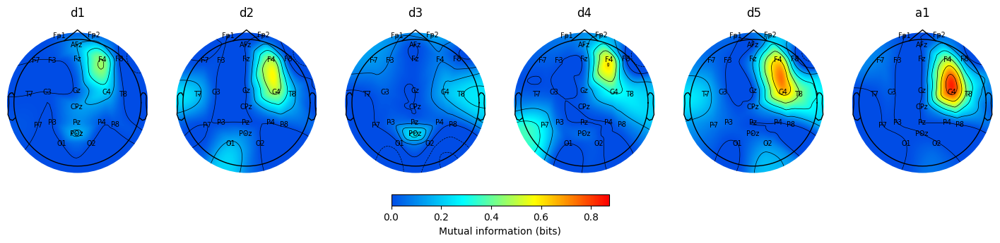

/tmp/ipykernel_180521/1315560365.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

80
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 26.67%
Std Dev of K-Fold Test Accuracy of KNN: 16.18%
Average K-Fold Test Precision of KNN: 0.20
Average K-Fold Test Recall of KNN: 0.28
Average K-Fold Test F1 Score of KNN: 0.21
Average K-Fold Test ROC AUC of KNN: 0.60
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 43.81%
Std Dev of K-Fold Test Accuracy of Random Forest: 18.08%
Average K-Fold Test Precision of Random Forest: 0.36
Average K-Fold Test Recall of Random Forest: 0.45
Average K-Fold Test F1 Score of Random Forest: 0.37
Average K-Fold Test ROC AUC of Random Forest: 0.80
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 40.95%
Std Dev of K-Fold Test Accuracy of MLP: 24.99%
Average K-Fold Test Precision of MLP: 0.36
Average K-Fold Test Recall of MLP: 0.42
Average K-Fold Test F1 Score of MLP: 0.37
Average K-Fold Test ROC AUC of MLP: 0.63
------------------------------------------------------------
KNN Classification Accuracy: 0.3125
Random Forest Classification Accuracy: 0.3125
MLP Classification Accuracy: 0.25
Ensemble Classification Accuracy: 0.3125


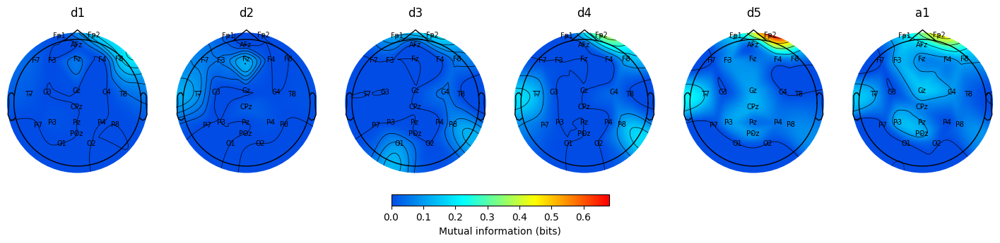

/tmp/ipykernel_180521/1315560365.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

80
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 43.57%
Std Dev of K-Fold Test Accuracy of KNN: 10.86%
Average K-Fold Test Precision of KNN: 0.36
Average K-Fold Test Recall of KNN: 0.45
Average K-Fold Test F1 Score of KNN: 0.37
Average K-Fold Test ROC AUC of KNN: 0.77
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 54.52%
Std Dev of K-Fold Test Accuracy of Random Forest: 15.34%
Average K-Fold Test Precision of Random Forest: 0.48
Average K-Fold Test Recall of Random Forest: 0.53
Average K-Fold Test F1 Score of Random Forest: 0.47
Average K-Fold Test ROC AUC of Random Forest: 0.84
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 39.29%
Std Dev of K-Fold Test Accuracy of MLP: 12.92%
Average K-Fold Test Precision of MLP: 0.30
Average K-Fold Test Recall of MLP: 0.39
Average K-Fold Test F1 Score of MLP: 0.32
Average K-Fold Test ROC AUC of MLP: 0.68
------------------------------------------------------------
KNN Classification Accuracy: 0.4375
Random Forest Classification Accuracy: 0.4375
MLP Classification Accuracy: 0.375
Ensemble Classification Accuracy: 0.375


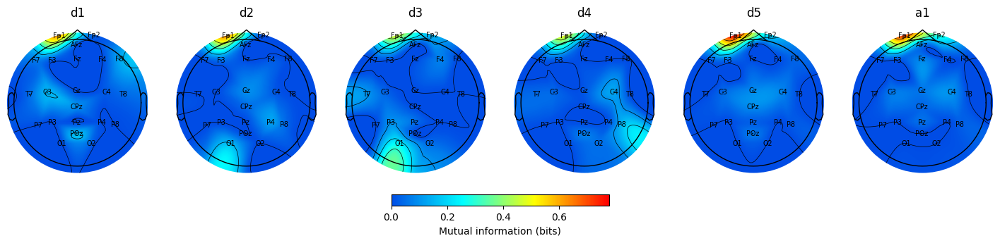

/tmp/ipykernel_180521/1315560365.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

80
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 31.19%
Std Dev of K-Fold Test Accuracy of KNN: 15.70%
Average K-Fold Test Precision of KNN: 0.28
Average K-Fold Test Recall of KNN: 0.33
Average K-Fold Test F1 Score of KNN: 0.28
Average K-Fold Test ROC AUC of KNN: 0.61
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 42.14%
Std Dev of K-Fold Test Accuracy of Random Forest: 11.76%
Average K-Fold Test Precision of Random Forest: 0.39
Average K-Fold Test Recall of Random Forest: 0.42
Average K-Fold Test F1 Score of Random Forest: 0.39
Average K-Fold Test ROC AUC of Random Forest: 0.72
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 35.00%
Std Dev of K-Fold Test Accuracy of MLP: 23.91%
Average K-Fold Test Precision of MLP: 0.29
Average K-Fold Test Recall of MLP: 0.36
Average K-Fold Test F1 Score of MLP: 0.31
Average K-Fold Test ROC AUC of MLP: 0.65
------------------------------------------------------------
KNN Classification Accuracy: 0.3125
Random Forest Classification Accuracy: 0.4375
MLP Classification Accuracy: 0.375
Ensemble Classification Accuracy: 0.4375


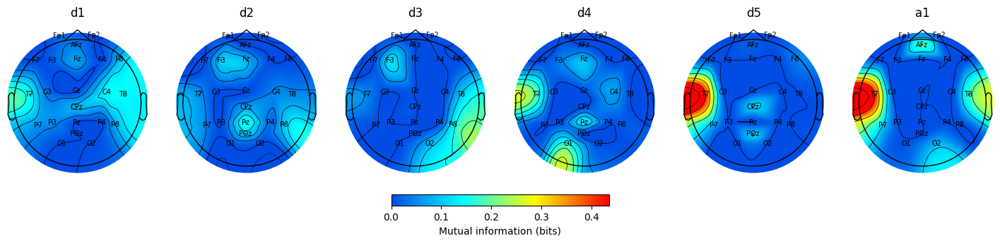

/tmp/ipykernel_180521/1315560365.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

80
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 29.05%
Std Dev of K-Fold Test Accuracy of KNN: 15.28%
Average K-Fold Test Precision of KNN: 0.20
Average K-Fold Test Recall of KNN: 0.26
Average K-Fold Test F1 Score of KNN: 0.20
Average K-Fold Test ROC AUC of KNN: 0.53
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 57.62%
Std Dev of K-Fold Test Accuracy of Random Forest: 15.39%
Average K-Fold Test Precision of Random Forest: 0.48
Average K-Fold Test Recall of Random Forest: 0.57
Average K-Fold Test F1 Score of Random Forest: 0.50
Average K-Fold Test ROC AUC of Random Forest: 0.75
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 33.57%
Std Dev of K-Fold Test Accuracy of MLP: 18.27%
Average K-Fold Test Precision of MLP: 0.28
Average K-Fold Test Recall of MLP: 0.33
Average K-Fold Test F1 Score of MLP: 0.27
Average K-Fold Test ROC AUC of MLP: 0.64
------------------------------------------------------------
KNN Classification Accuracy: 0.3125
Random Forest Classification Accuracy: 0.5
MLP Classification Accuracy: 0.5
Ensemble Classification Accuracy: 0.5


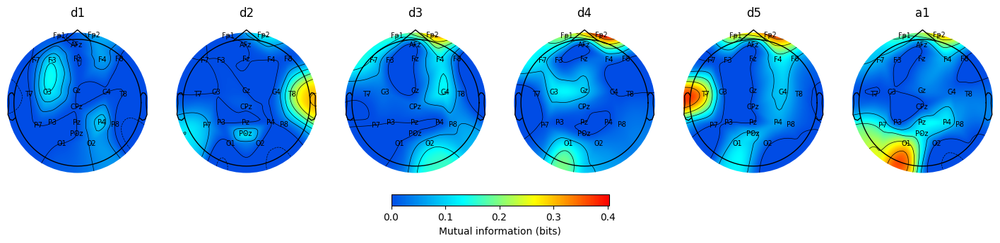

/tmp/ipykernel_180521/1315560365.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

80
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 25.95%
Std Dev of K-Fold Test Accuracy of KNN: 16.55%
Average K-Fold Test Precision of KNN: 0.17
Average K-Fold Test Recall of KNN: 0.24
Average K-Fold Test F1 Score of KNN: 0.19
Average K-Fold Test ROC AUC of KNN: 0.49
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 42.38%
Std Dev of K-Fold Test Accuracy of Random Forest: 15.86%
Average K-Fold Test Precision of Random Forest: 0.36
Average K-Fold Test Recall of Random Forest: 0.41
Average K-Fold Test F1 Score of Random Forest: 0.37
Average K-Fold Test ROC AUC of Random Forest: 0.66
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 36.19%
Std Dev of K-Fold Test Accuracy of MLP: 13.21%
Average K-Fold Test Precision of MLP: 0.30
Average K-Fold Test Recall of MLP: 0.36
Average K-Fold Test F1 Score of MLP: 0.31
Average K-Fold Test ROC AUC of MLP: 0.57
------------------------------------------------------------
KNN Classification Accuracy: 0.3125
Random Forest Classification Accuracy: 0.1875
MLP Classification Accuracy: 0.25
Ensemble Classification Accuracy: 0.3125


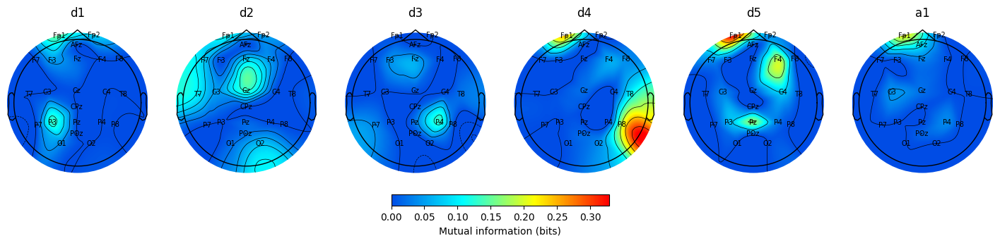

/tmp/ipykernel_180521/1315560365.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

80
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 20.24%
Std Dev of K-Fold Test Accuracy of KNN: 10.00%
Average K-Fold Test Precision of KNN: 0.11
Average K-Fold Test Recall of KNN: 0.20
Average K-Fold Test F1 Score of KNN: 0.14
Average K-Fold Test ROC AUC of KNN: 0.56
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 20.71%
Std Dev of K-Fold Test Accuracy of Random Forest: 11.17%
Average K-Fold Test Precision of Random Forest: 0.15
Average K-Fold Test Recall of Random Forest: 0.19
Average K-Fold Test F1 Score of Random Forest: 0.16
Average K-Fold Test ROC AUC of Random Forest: 0.52
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 23.57%
Std Dev of K-Fold Test Accuracy of MLP: 16.06%
Average K-Fold Test Precision of MLP: 0.19
Average K-Fold Test Recall of MLP: 0.24
Average K-Fold Test F1 Score of MLP: 0.19
Average K-Fold Test ROC AUC of MLP: 0.44
------------------------------------------------------------
KNN Classification Accuracy: 0.375
Random Forest Classification Accuracy: 0.3125
MLP Classification Accuracy: 0.375
Ensemble Classification Accuracy: 0.4375


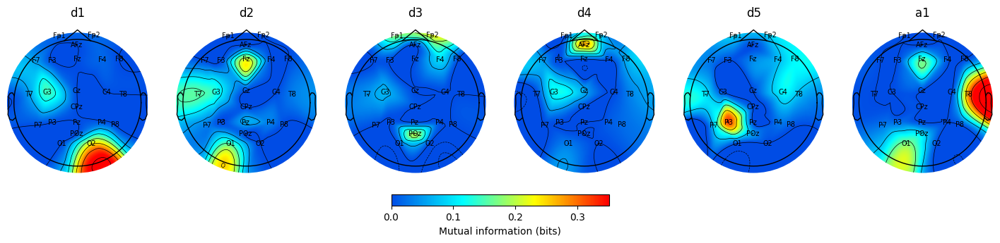

/tmp/ipykernel_180521/1315560365.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

80
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 21.67%
Std Dev of K-Fold Test Accuracy of KNN: 11.93%
Average K-Fold Test Precision of KNN: 0.10
Average K-Fold Test Recall of KNN: 0.21
Average K-Fold Test F1 Score of KNN: 0.13
Average K-Fold Test ROC AUC of KNN: 0.54
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 27.62%
Std Dev of K-Fold Test Accuracy of Random Forest: 14.05%
Average K-Fold Test Precision of Random Forest: 0.17
Average K-Fold Test Recall of Random Forest: 0.29
Average K-Fold Test F1 Score of Random Forest: 0.20
Average K-Fold Test ROC AUC of Random Forest: 0.53
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 29.05%
Std Dev of K-Fold Test Accuracy of MLP: 16.56%
Average K-Fold Test Precision of MLP: 0.24
Average K-Fold Test Recall of MLP: 0.31
Average K-Fold Test F1 Score of MLP: 0.25
Average K-Fold Test ROC AUC of MLP: 0.57
------------------------------------------------------------
KNN Classification Accuracy: 0.25
Random Forest Classification Accuracy: 0.25
MLP Classification Accuracy: 0.3125
Ensemble Classification Accuracy: 0.3125


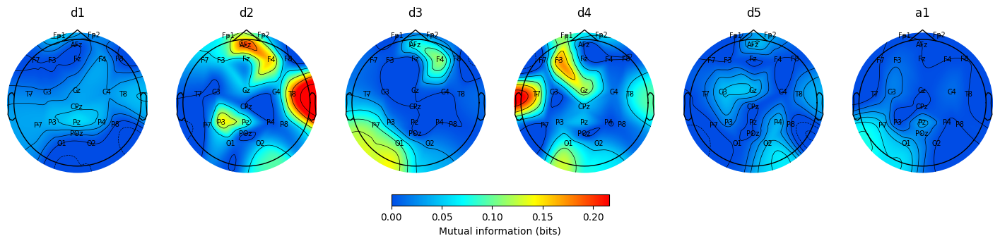

/tmp/ipykernel_180521/1315560365.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

66
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 25.00%
Std Dev of K-Fold Test Accuracy of KNN: 13.60%
Average K-Fold Test Precision of KNN: 0.15
Average K-Fold Test Recall of KNN: 0.24
Average K-Fold Test F1 Score of KNN: 0.17
Average K-Fold Test ROC AUC of KNN: 0.60
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 31.67%
Std Dev of K-Fold Test Accuracy of Random Forest: 18.57%
Average K-Fold Test Precision of Random Forest: 0.25
Average K-Fold Test Recall of Random Forest: 0.33
Average K-Fold Test F1 Score of Random Forest: 0.26
Average K-Fold Test ROC AUC of Random Forest: 0.57
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 35.00%
Std Dev of K-Fold Test Accuracy of MLP: 20.62%
Average K-Fold Test Precision of MLP: 0.26
Average K-Fold Test Recall of MLP: 0.33
Average K-Fold Test F1 Score of MLP: 0.27
Average K-Fold Test ROC AUC of MLP: 0.64
------------------------------------------------------------
KNN Classification Accuracy: 0.21428571428571427
Random Forest Classification Accuracy: 0.14285714285714285
MLP Classification Accuracy: 0.35714285714285715
Ensemble Classification Accuracy: 0.2857142857142857


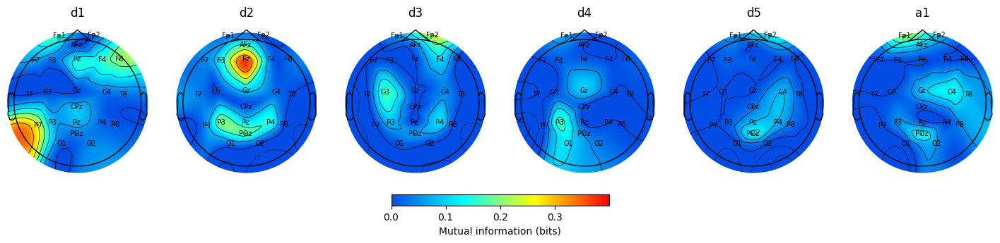

/tmp/ipykernel_180521/1315560365.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

80
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 30.24%
Std Dev of K-Fold Test Accuracy of KNN: 12.28%
Average K-Fold Test Precision of KNN: 0.22
Average K-Fold Test Recall of KNN: 0.30
Average K-Fold Test F1 Score of KNN: 0.23
Average K-Fold Test ROC AUC of KNN: 0.57
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 51.67%
Std Dev of K-Fold Test Accuracy of Random Forest: 14.56%
Average K-Fold Test Precision of Random Forest: 0.48
Average K-Fold Test Recall of Random Forest: 0.51
Average K-Fold Test F1 Score of Random Forest: 0.47
Average K-Fold Test ROC AUC of Random Forest: 0.73
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 40.71%
Std Dev of K-Fold Test Accuracy of MLP: 17.93%
Average K-Fold Test Precision of MLP: 0.37
Average K-Fold Test Recall of MLP: 0.42
Average K-Fold Test F1 Score of MLP: 0.37
Average K-Fold Test ROC AUC of MLP: 0.70
------------------------------------------------------------
KNN Classification Accuracy: 0.375
Random Forest Classification Accuracy: 0.6875
MLP Classification Accuracy: 0.5
Ensemble Classification Accuracy: 0.625


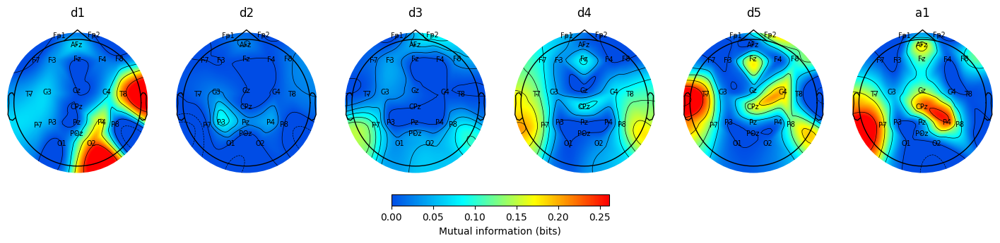

/tmp/ipykernel_180521/1315560365.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

80
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 26.90%
Std Dev of K-Fold Test Accuracy of KNN: 19.17%
Average K-Fold Test Precision of KNN: 0.18
Average K-Fold Test Recall of KNN: 0.26
Average K-Fold Test F1 Score of KNN: 0.19
Average K-Fold Test ROC AUC of KNN: 0.53
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 26.43%
Std Dev of K-Fold Test Accuracy of Random Forest: 14.02%
Average K-Fold Test Precision of Random Forest: 0.20
Average K-Fold Test Recall of Random Forest: 0.26
Average K-Fold Test F1 Score of Random Forest: 0.21
Average K-Fold Test ROC AUC of Random Forest: 0.52
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 37.14%
Std Dev of K-Fold Test Accuracy of MLP: 19.90%
Average K-Fold Test Precision of MLP: 0.31
Average K-Fold Test Recall of MLP: 0.38
Average K-Fold Test F1 Score of MLP: 0.31
Average K-Fold Test ROC AUC of MLP: 0.56
------------------------------------------------------------
KNN Classification Accuracy: 0.125
Random Forest Classification Accuracy: 0.125
MLP Classification Accuracy: 0.125
Ensemble Classification Accuracy: 0.125


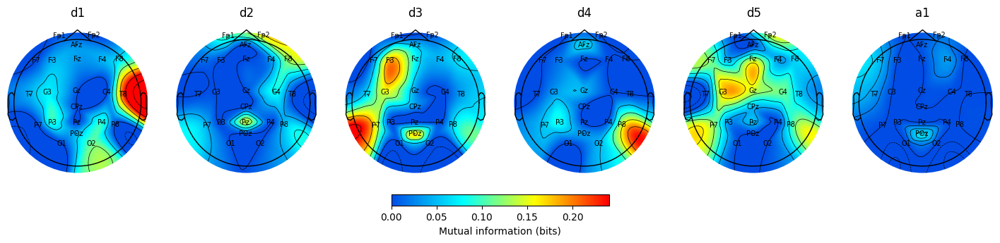

/tmp/ipykernel_180521/1315560365.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

80
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 37.14%
Std Dev of K-Fold Test Accuracy of KNN: 18.75%
Average K-Fold Test Precision of KNN: 0.34
Average K-Fold Test Recall of KNN: 0.38
Average K-Fold Test F1 Score of KNN: 0.32
Average K-Fold Test ROC AUC of KNN: 0.66
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 61.19%
Std Dev of K-Fold Test Accuracy of Random Forest: 11.42%
Average K-Fold Test Precision of Random Forest: 0.52
Average K-Fold Test Recall of Random Forest: 0.55
Average K-Fold Test F1 Score of Random Forest: 0.51
Average K-Fold Test ROC AUC of Random Forest: 0.80
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 49.76%
Std Dev of K-Fold Test Accuracy of MLP: 14.66%
Average K-Fold Test Precision of MLP: 0.42
Average K-Fold Test Recall of MLP: 0.47
Average K-Fold Test F1 Score of MLP: 0.43
Average K-Fold Test ROC AUC of MLP: 0.75
------------------------------------------------------------
KNN Classification Accuracy: 0.4375
Random Forest Classification Accuracy: 0.5
MLP Classification Accuracy: 0.3125
Ensemble Classification Accuracy: 0.5


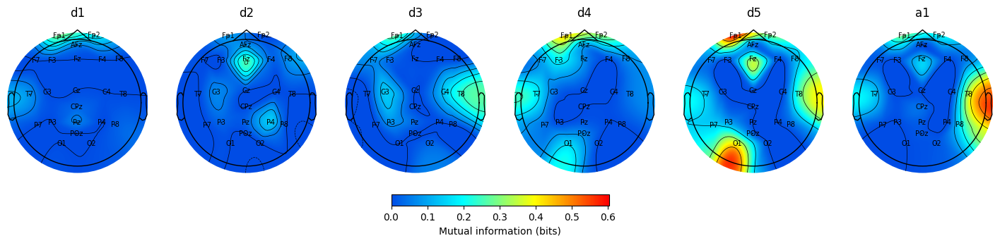

/tmp/ipykernel_180521/1315560365.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

80
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 42.14%
Std Dev of K-Fold Test Accuracy of KNN: 17.37%
Average K-Fold Test Precision of KNN: 0.45
Average K-Fold Test Recall of KNN: 0.41
Average K-Fold Test F1 Score of KNN: 0.40
Average K-Fold Test ROC AUC of KNN: 0.78
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 65.00%
Std Dev of K-Fold Test Accuracy of Random Forest: 16.36%
Average K-Fold Test Precision of Random Forest: 0.61
Average K-Fold Test Recall of Random Forest: 0.62
Average K-Fold Test F1 Score of Random Forest: 0.61
Average K-Fold Test ROC AUC of Random Forest: 0.87
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 59.76%
Std Dev of K-Fold Test Accuracy of MLP: 10.93%
Average K-Fold Test Precision of MLP: 0.54
Average K-Fold Test Recall of MLP: 0.57
Average K-Fold Test F1 Score of MLP: 0.53
Average K-Fold Test ROC AUC of MLP: 0.82
------------------------------------------------------------
KNN Classification Accuracy: 0.3125
Random Forest Classification Accuracy: 0.625
MLP Classification Accuracy: 0.5
Ensemble Classification Accuracy: 0.5


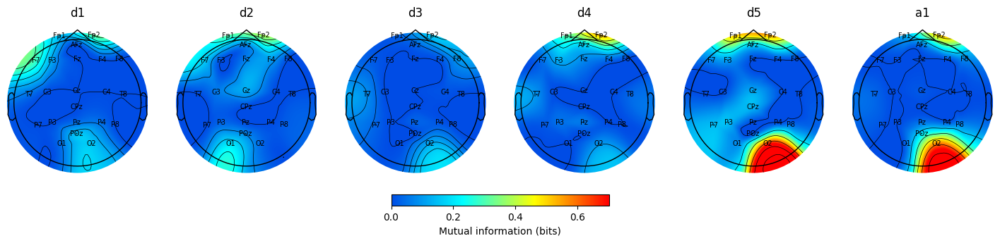

/tmp/ipykernel_180521/1315560365.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

80
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 42.14%
Std Dev of K-Fold Test Accuracy of KNN: 9.88%
Average K-Fold Test Precision of KNN: 0.35
Average K-Fold Test Recall of KNN: 0.42
Average K-Fold Test F1 Score of KNN: 0.34
Average K-Fold Test ROC AUC of KNN: 0.69
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 40.95%
Std Dev of K-Fold Test Accuracy of Random Forest: 16.39%
Average K-Fold Test Precision of Random Forest: 0.30
Average K-Fold Test Recall of Random Forest: 0.42
Average K-Fold Test F1 Score of Random Forest: 0.33
Average K-Fold Test ROC AUC of Random Forest: 0.64
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 36.67%
Std Dev of K-Fold Test Accuracy of MLP: 16.74%
Average K-Fold Test Precision of MLP: 0.25
Average K-Fold Test Recall of MLP: 0.35
Average K-Fold Test F1 Score of MLP: 0.28
Average K-Fold Test ROC AUC of MLP: 0.62
------------------------------------------------------------
KNN Classification Accuracy: 0.0625
Random Forest Classification Accuracy: 0.25
MLP Classification Accuracy: 0.125
Ensemble Classification Accuracy: 0.125


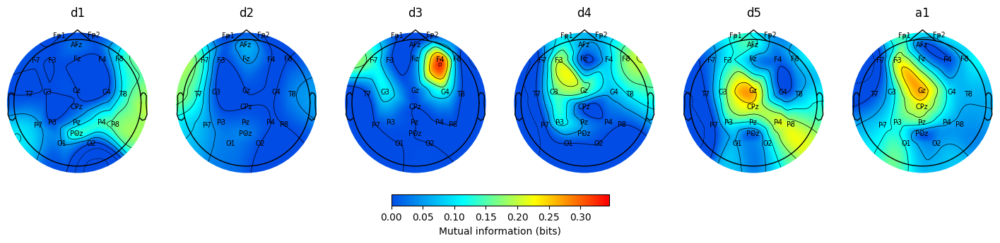

/tmp/ipykernel_180521/1315560365.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

80
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 40.95%
Std Dev of K-Fold Test Accuracy of KNN: 11.46%
Average K-Fold Test Precision of KNN: 0.32
Average K-Fold Test Recall of KNN: 0.40
Average K-Fold Test F1 Score of KNN: 0.33
Average K-Fold Test ROC AUC of KNN: 0.71
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 47.14%
Std Dev of K-Fold Test Accuracy of Random Forest: 8.23%
Average K-Fold Test Precision of Random Forest: 0.39
Average K-Fold Test Recall of Random Forest: 0.45
Average K-Fold Test F1 Score of Random Forest: 0.39
Average K-Fold Test ROC AUC of Random Forest: 0.74
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 45.48%
Std Dev of K-Fold Test Accuracy of MLP: 9.13%
Average K-Fold Test Precision of MLP: 0.35
Average K-Fold Test Recall of MLP: 0.42
Average K-Fold Test F1 Score of MLP: 0.36
Average K-Fold Test ROC AUC of MLP: 0.78
------------------------------------------------------------
KNN Classification Accuracy: 0.4375
Random Forest Classification Accuracy: 0.4375
MLP Classification Accuracy: 0.375
Ensemble Classification Accuracy: 0.5


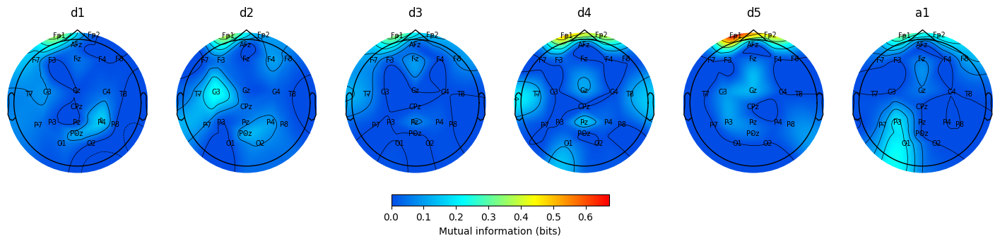

/tmp/ipykernel_180521/1315560365.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

80
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 21.67%
Std Dev of K-Fold Test Accuracy of KNN: 6.77%
Average K-Fold Test Precision of KNN: 0.14
Average K-Fold Test Recall of KNN: 0.19
Average K-Fold Test F1 Score of KNN: 0.14
Average K-Fold Test ROC AUC of KNN: 0.46
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 34.05%
Std Dev of K-Fold Test Accuracy of Random Forest: 10.60%
Average K-Fold Test Precision of Random Forest: 0.26
Average K-Fold Test Recall of Random Forest: 0.34
Average K-Fold Test F1 Score of Random Forest: 0.28
Average K-Fold Test ROC AUC of Random Forest: 0.56
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 32.14%
Std Dev of K-Fold Test Accuracy of MLP: 14.65%
Average K-Fold Test Precision of MLP: 0.28
Average K-Fold Test Recall of MLP: 0.29
Average K-Fold Test F1 Score of MLP: 0.27
Average K-Fold Test ROC AUC of MLP: 0.50
------------------------------------------------------------
KNN Classification Accuracy: 0.1875
Random Forest Classification Accuracy: 0.25
MLP Classification Accuracy: 0.1875
Ensemble Classification Accuracy: 0.25


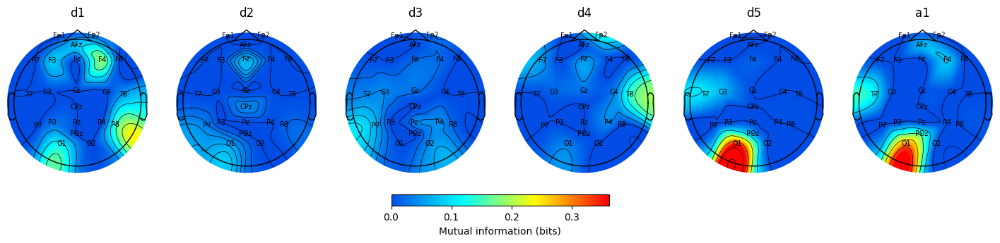

/tmp/ipykernel_180521/1315560365.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

80
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 31.67%
Std Dev of K-Fold Test Accuracy of KNN: 18.20%
Average K-Fold Test Precision of KNN: 0.22
Average K-Fold Test Recall of KNN: 0.31
Average K-Fold Test F1 Score of KNN: 0.24
Average K-Fold Test ROC AUC of KNN: 0.56
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 33.57%
Std Dev of K-Fold Test Accuracy of Random Forest: 14.69%
Average K-Fold Test Precision of Random Forest: 0.31
Average K-Fold Test Recall of Random Forest: 0.34
Average K-Fold Test F1 Score of Random Forest: 0.30
Average K-Fold Test ROC AUC of Random Forest: 0.53
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 27.14%
Std Dev of K-Fold Test Accuracy of MLP: 14.99%
Average K-Fold Test Precision of MLP: 0.22
Average K-Fold Test Recall of MLP: 0.28
Average K-Fold Test F1 Score of MLP: 0.22
Average K-Fold Test ROC AUC of MLP: 0.53
------------------------------------------------------------
KNN Classification Accuracy: 0.1875
Random Forest Classification Accuracy: 0.25
MLP Classification Accuracy: 0.3125
Ensemble Classification Accuracy: 0.25


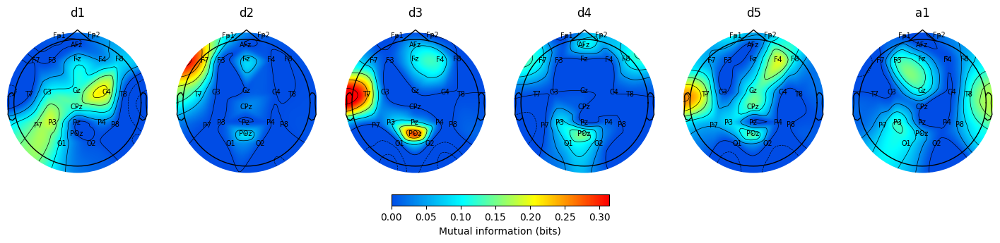

/tmp/ipykernel_180521/1315560365.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

78
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 30.24%
Std Dev of K-Fold Test Accuracy of KNN: 13.72%
Average K-Fold Test Precision of KNN: 0.24
Average K-Fold Test Recall of KNN: 0.34
Average K-Fold Test F1 Score of KNN: 0.25
Average K-Fold Test ROC AUC of KNN: 0.62
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 42.14%
Std Dev of K-Fold Test Accuracy of Random Forest: 15.47%
Average K-Fold Test Precision of Random Forest: 0.41
Average K-Fold Test Recall of Random Forest: 0.46
Average K-Fold Test F1 Score of Random Forest: 0.42
Average K-Fold Test ROC AUC of Random Forest: 0.65
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 44.05%
Std Dev of K-Fold Test Accuracy of MLP: 21.41%
Average K-Fold Test Precision of MLP: 0.37
Average K-Fold Test Recall of MLP: 0.42
Average K-Fold Test F1 Score of MLP: 0.37
Average K-Fold Test ROC AUC of MLP: 0.64
------------------------------------------------------------
KNN Classification Accuracy: 0.125
Random Forest Classification Accuracy: 0.4375
MLP Classification Accuracy: 0.3125
Ensemble Classification Accuracy: 0.375


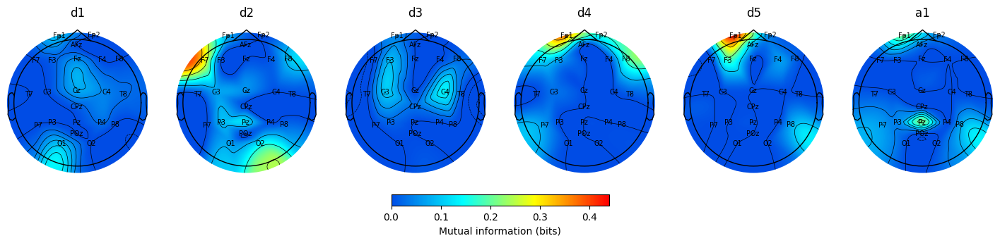

/tmp/ipykernel_180521/1315560365.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

70
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 42.33%
Std Dev of K-Fold Test Accuracy of KNN: 15.99%
Average K-Fold Test Precision of KNN: 0.35
Average K-Fold Test Recall of KNN: 0.44
Average K-Fold Test F1 Score of KNN: 0.36
Average K-Fold Test ROC AUC of KNN: 0.76
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 46.33%
Std Dev of K-Fold Test Accuracy of Random Forest: 20.30%
Average K-Fold Test Precision of Random Forest: 0.38
Average K-Fold Test Recall of Random Forest: 0.44
Average K-Fold Test F1 Score of Random Forest: 0.39
Average K-Fold Test ROC AUC of Random Forest: 0.81
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 57.67%
Std Dev of K-Fold Test Accuracy of MLP: 14.99%
Average K-Fold Test Precision of MLP: 0.49
Average K-Fold Test Recall of MLP: 0.57
Average K-Fold Test F1 Score of MLP: 0.50
Average K-Fold Test ROC AUC of MLP: 0.75
------------------------------------------------------------
KNN Classification Accuracy: 0.21428571428571427
Random Forest Classification Accuracy: 0.5
MLP Classification Accuracy: 0.42857142857142855
Ensemble Classification Accuracy: 0.42857142857142855


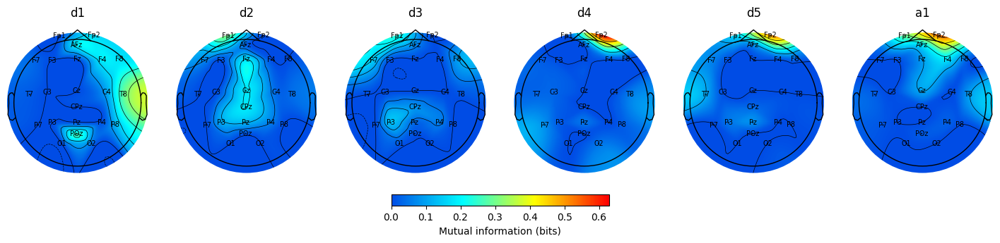

/tmp/ipykernel_180521/1315560365.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

80
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 51.43%
Std Dev of K-Fold Test Accuracy of KNN: 13.60%
Average K-Fold Test Precision of KNN: 0.44
Average K-Fold Test Recall of KNN: 0.50
Average K-Fold Test F1 Score of KNN: 0.43
Average K-Fold Test ROC AUC of KNN: 0.81
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 90.71%
Std Dev of K-Fold Test Accuracy of Random Forest: 9.96%
Average K-Fold Test Precision of Random Forest: 0.86
Average K-Fold Test Recall of Random Forest: 0.89
Average K-Fold Test F1 Score of Random Forest: 0.86
Average K-Fold Test ROC AUC of Random Forest: 0.98
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 79.76%
Std Dev of K-Fold Test Accuracy of MLP: 11.87%
Average K-Fold Test Precision of MLP: 0.74
Average K-Fold Test Recall of MLP: 0.76
Average K-Fold Test F1 Score of MLP: 0.74
Average K-Fold Test ROC AUC of MLP: 0.91
------------------------------------------------------------
KNN Classification Accuracy: 0.4375
Random Forest Classification Accuracy: 0.9375
MLP Classification Accuracy: 0.9375
Ensemble Classification Accuracy: 0.875


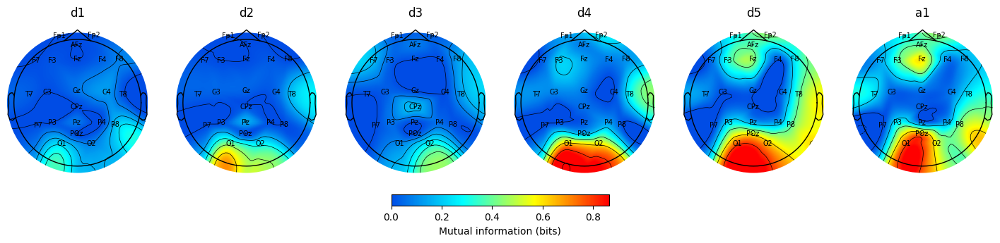

/tmp/ipykernel_180521/1315560365.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

80
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 53.10%
Std Dev of K-Fold Test Accuracy of KNN: 10.97%
Average K-Fold Test Precision of KNN: 0.50
Average K-Fold Test Recall of KNN: 0.53
Average K-Fold Test F1 Score of KNN: 0.48
Average K-Fold Test ROC AUC of KNN: 0.77
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 82.38%
Std Dev of K-Fold Test Accuracy of Random Forest: 15.36%
Average K-Fold Test Precision of Random Forest: 0.83
Average K-Fold Test Recall of Random Forest: 0.84
Average K-Fold Test F1 Score of Random Forest: 0.81
Average K-Fold Test ROC AUC of Random Forest: 0.90
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 74.52%
Std Dev of K-Fold Test Accuracy of MLP: 16.87%
Average K-Fold Test Precision of MLP: 0.75
Average K-Fold Test Recall of MLP: 0.75
Average K-Fold Test F1 Score of MLP: 0.71
Average K-Fold Test ROC AUC of MLP: 0.90
------------------------------------------------------------
KNN Classification Accuracy: 0.625
Random Forest Classification Accuracy: 0.875
MLP Classification Accuracy: 0.875
Ensemble Classification Accuracy: 0.875


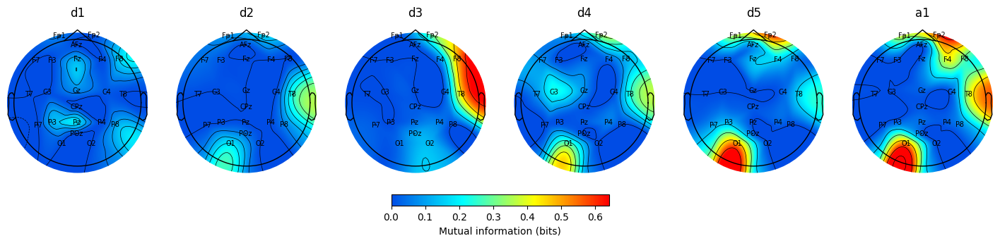

/tmp/ipykernel_180521/1315560365.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

80
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 44.76%
Std Dev of K-Fold Test Accuracy of KNN: 22.46%
Average K-Fold Test Precision of KNN: 0.42
Average K-Fold Test Recall of KNN: 0.47
Average K-Fold Test F1 Score of KNN: 0.41
Average K-Fold Test ROC AUC of KNN: 0.75
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 59.76%
Std Dev of K-Fold Test Accuracy of Random Forest: 20.13%
Average K-Fold Test Precision of Random Forest: 0.55
Average K-Fold Test Recall of Random Forest: 0.59
Average K-Fold Test F1 Score of Random Forest: 0.54
Average K-Fold Test ROC AUC of Random Forest: 0.84
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 59.29%
Std Dev of K-Fold Test Accuracy of MLP: 14.89%
Average K-Fold Test Precision of MLP: 0.59
Average K-Fold Test Recall of MLP: 0.60
Average K-Fold Test F1 Score of MLP: 0.57
Average K-Fold Test ROC AUC of MLP: 0.79
------------------------------------------------------------
KNN Classification Accuracy: 0.375
Random Forest Classification Accuracy: 0.625
MLP Classification Accuracy: 0.75
Ensemble Classification Accuracy: 0.5625


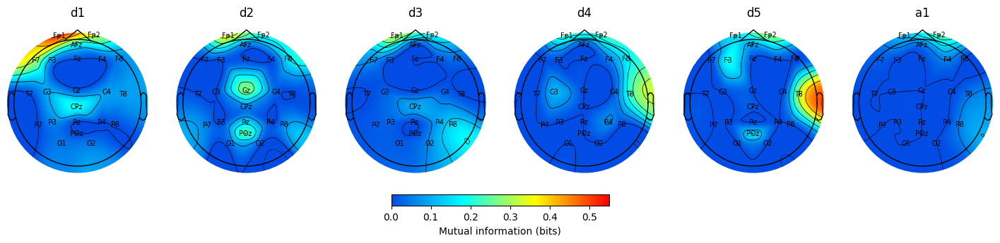

/tmp/ipykernel_180521/1315560365.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

80
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 70.24%
Std Dev of K-Fold Test Accuracy of KNN: 13.27%
Average K-Fold Test Precision of KNN: 0.70
Average K-Fold Test Recall of KNN: 0.71
Average K-Fold Test F1 Score of KNN: 0.67
Average K-Fold Test ROC AUC of KNN: 0.92
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 90.48%
Std Dev of K-Fold Test Accuracy of Random Forest: 12.55%
Average K-Fold Test Precision of Random Forest: 0.86
Average K-Fold Test Recall of Random Forest: 0.89
Average K-Fold Test F1 Score of Random Forest: 0.87
Average K-Fold Test ROC AUC of Random Forest: 0.98
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 80.00%
Std Dev of K-Fold Test Accuracy of MLP: 9.36%
Average K-Fold Test Precision of MLP: 0.77
Average K-Fold Test Recall of MLP: 0.79
Average K-Fold Test F1 Score of MLP: 0.76
Average K-Fold Test ROC AUC of MLP: 0.95
------------------------------------------------------------
KNN Classification Accuracy: 0.8125
Random Forest Classification Accuracy: 1.0
MLP Classification Accuracy: 0.8125
Ensemble Classification Accuracy: 0.9375


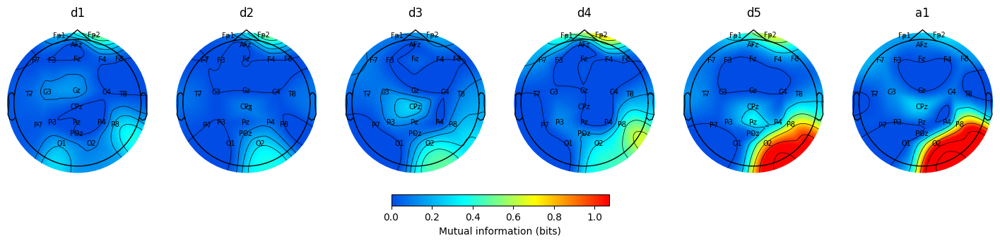

/tmp/ipykernel_180521/1315560365.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

80
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 88.81%
Std Dev of K-Fold Test Accuracy of KNN: 10.49%
Average K-Fold Test Precision of KNN: 0.87
Average K-Fold Test Recall of KNN: 0.89
Average K-Fold Test F1 Score of KNN: 0.86
Average K-Fold Test ROC AUC of KNN: 0.98
------------------------------------------------------------
------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 100.00%
Std Dev of K-Fold Test Accuracy of Random Forest: 0.00%
Average K-Fold Test Precision of Random Forest: 1.00
Average K-Fold Test Recall of Random Forest: 1.00
Average K-Fold Test F1 Score of Random Forest: 1.00
Average K-Fold Test ROC AUC of Random Forest: 1.00
------------------------------------------------------------
------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 90.48%
Std Dev of K-Fold Test Accuracy of MLP: 10.81%
Average K-Fold Test Precisi

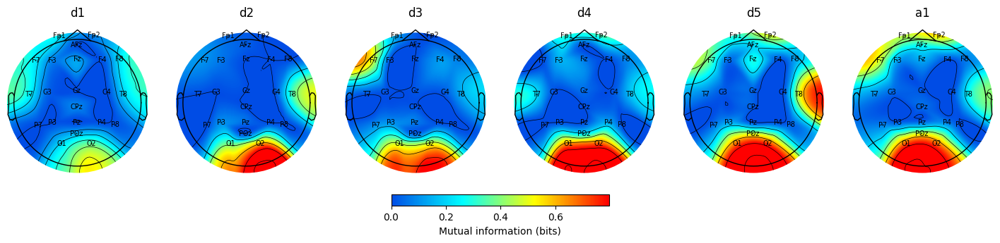

/tmp/ipykernel_180521/1315560365.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

80
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 27.62%
Std Dev of K-Fold Test Accuracy of KNN: 15.44%
Average K-Fold Test Precision of KNN: 0.23
Average K-Fold Test Recall of KNN: 0.26
Average K-Fold Test F1 Score of KNN: 0.22
Average K-Fold Test ROC AUC of KNN: 0.63
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 35.24%
Std Dev of K-Fold Test Accuracy of Random Forest: 13.83%
Average K-Fold Test Precision of Random Forest: 0.27
Average K-Fold Test Recall of Random Forest: 0.38
Average K-Fold Test F1 Score of Random Forest: 0.29
Average K-Fold Test ROC AUC of Random Forest: 0.65
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 33.81%
Std Dev of K-Fold Test Accuracy of MLP: 16.42%
Average K-Fold Test Precision of MLP: 0.23
Average K-Fold Test Recall of MLP: 0.35
Average K-Fold Test F1 Score of MLP: 0.27
Average K-Fold Test ROC AUC of MLP: 0.59
------------------------------------------------------------
KNN Classification Accuracy: 0.125
Random Forest Classification Accuracy: 0.0625
MLP Classification Accuracy: 0.25
Ensemble Classification Accuracy: 0.1875


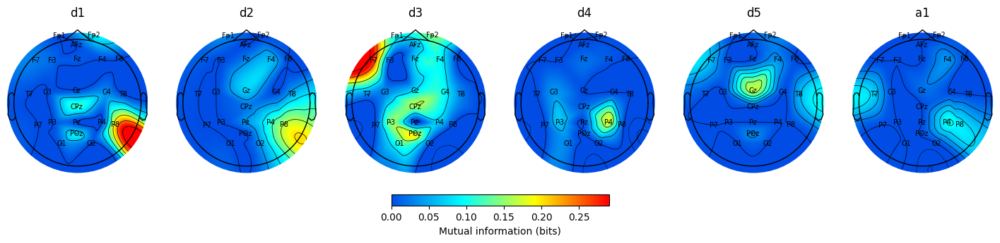

/tmp/ipykernel_180521/1315560365.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

76
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 35.00%
Std Dev of K-Fold Test Accuracy of KNN: 13.84%
Average K-Fold Test Precision of KNN: 0.24
Average K-Fold Test Recall of KNN: 0.36
Average K-Fold Test F1 Score of KNN: 0.26
Average K-Fold Test ROC AUC of KNN: 0.62
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 63.33%
Std Dev of K-Fold Test Accuracy of Random Forest: 16.33%
Average K-Fold Test Precision of Random Forest: 0.61
Average K-Fold Test Recall of Random Forest: 0.64
Average K-Fold Test F1 Score of Random Forest: 0.59
Average K-Fold Test ROC AUC of Random Forest: 0.85
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 55.00%
Std Dev of K-Fold Test Accuracy of MLP: 16.75%
Average K-Fold Test Precision of MLP: 0.50
Average K-Fold Test Recall of MLP: 0.57
Average K-Fold Test F1 Score of MLP: 0.50
Average K-Fold Test ROC AUC of MLP: 0.79
------------------------------------------------------------
KNN Classification Accuracy: 0.375
Random Forest Classification Accuracy: 0.6875
MLP Classification Accuracy: 0.625
Ensemble Classification Accuracy: 0.8125


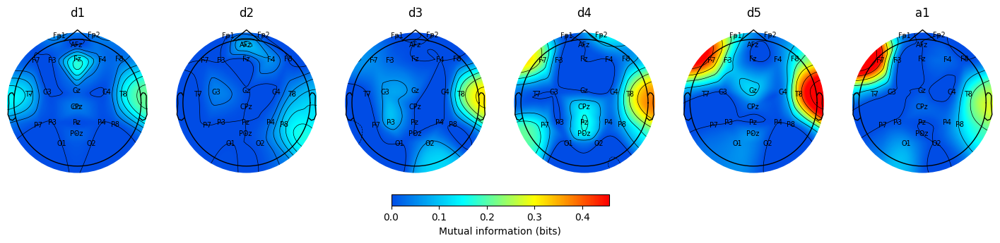

/tmp/ipykernel_180521/1315560365.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

80
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 33.57%
Std Dev of K-Fold Test Accuracy of KNN: 19.18%
Average K-Fold Test Precision of KNN: 0.23
Average K-Fold Test Recall of KNN: 0.31
Average K-Fold Test F1 Score of KNN: 0.24
Average K-Fold Test ROC AUC of KNN: 0.61
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 41.19%
Std Dev of K-Fold Test Accuracy of Random Forest: 16.46%
Average K-Fold Test Precision of Random Forest: 0.35
Average K-Fold Test Recall of Random Forest: 0.40
Average K-Fold Test F1 Score of Random Forest: 0.37
Average K-Fold Test ROC AUC of Random Forest: 0.66
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 35.24%
Std Dev of K-Fold Test Accuracy of MLP: 23.32%
Average K-Fold Test Precision of MLP: 0.35
Average K-Fold Test Recall of MLP: 0.36
Average K-Fold Test F1 Score of MLP: 0.34
Average K-Fold Test ROC AUC of MLP: 0.63
------------------------------------------------------------
KNN Classification Accuracy: 0.4375
Random Forest Classification Accuracy: 0.625
MLP Classification Accuracy: 0.5625
Ensemble Classification Accuracy: 0.625


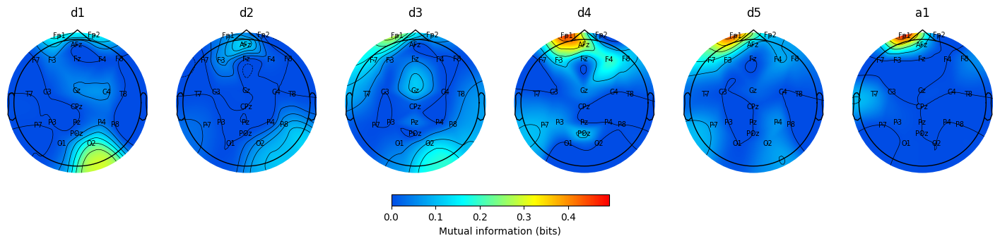

/tmp/ipykernel_180521/1315560365.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

80
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 32.86%
Std Dev of K-Fold Test Accuracy of KNN: 13.50%
Average K-Fold Test Precision of KNN: 0.29
Average K-Fold Test Recall of KNN: 0.36
Average K-Fold Test F1 Score of KNN: 0.28
Average K-Fold Test ROC AUC of KNN: 0.58
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 45.00%
Std Dev of K-Fold Test Accuracy of Random Forest: 17.35%
Average K-Fold Test Precision of Random Forest: 0.40
Average K-Fold Test Recall of Random Forest: 0.47
Average K-Fold Test F1 Score of Random Forest: 0.41
Average K-Fold Test ROC AUC of Random Forest: 0.69
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 36.90%
Std Dev of K-Fold Test Accuracy of MLP: 15.84%
Average K-Fold Test Precision of MLP: 0.28
Average K-Fold Test Recall of MLP: 0.39
Average K-Fold Test F1 Score of MLP: 0.32
Average K-Fold Test ROC AUC of MLP: 0.64
------------------------------------------------------------
KNN Classification Accuracy: 0.3125
Random Forest Classification Accuracy: 0.4375
MLP Classification Accuracy: 0.3125
Ensemble Classification Accuracy: 0.5


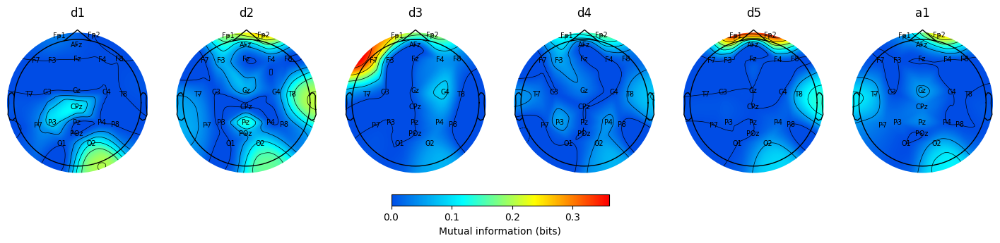

/tmp/ipykernel_180521/1315560365.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

80
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 26.43%
Std Dev of K-Fold Test Accuracy of KNN: 9.25%
Average K-Fold Test Precision of KNN: 0.20
Average K-Fold Test Recall of KNN: 0.25
Average K-Fold Test F1 Score of KNN: 0.20
Average K-Fold Test ROC AUC of KNN: 0.49
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 35.71%
Std Dev of K-Fold Test Accuracy of Random Forest: 17.69%
Average K-Fold Test Precision of Random Forest: 0.29
Average K-Fold Test Recall of Random Forest: 0.33
Average K-Fold Test F1 Score of Random Forest: 0.29
Average K-Fold Test ROC AUC of Random Forest: 0.64
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 23.57%
Std Dev of K-Fold Test Accuracy of MLP: 10.99%
Average K-Fold Test Precision of MLP: 0.18
Average K-Fold Test Recall of MLP: 0.23
Average K-Fold Test F1 Score of MLP: 0.19
Average K-Fold Test ROC AUC of MLP: 0.54
------------------------------------------------------------
KNN Classification Accuracy: 0.25
Random Forest Classification Accuracy: 0.125
MLP Classification Accuracy: 0.375
Ensemble Classification Accuracy: 0.3125


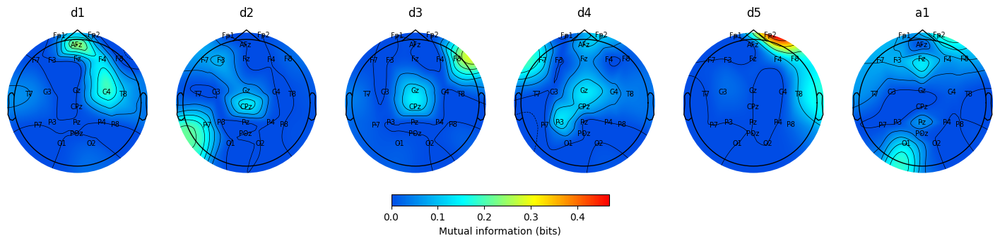

/tmp/ipykernel_180521/1315560365.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Class'] = df['Class'].map(class_mapping)
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(a

80
------------------------------------------------------------
Average K-Fold Test Accuracy of KNN: 24.76%
Std Dev of K-Fold Test Accuracy of KNN: 6.83%
Average K-Fold Test Precision of KNN: 0.11
Average K-Fold Test Recall of KNN: 0.24
Average K-Fold Test F1 Score of KNN: 0.14
Average K-Fold Test ROC AUC of KNN: 0.49
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of Random Forest: 26.90%
Std Dev of K-Fold Test Accuracy of Random Forest: 14.17%
Average K-Fold Test Precision of Random Forest: 0.20
Average K-Fold Test Recall of Random Forest: 0.28
Average K-Fold Test F1 Score of Random Forest: 0.21
Average K-Fold Test ROC AUC of Random Forest: 0.58
------------------------------------------------------------


/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lkcepza/anaconda3/envs/tf_test/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

------------------------------------------------------------
Average K-Fold Test Accuracy of MLP: 31.67%
Std Dev of K-Fold Test Accuracy of MLP: 21.03%
Average K-Fold Test Precision of MLP: 0.23
Average K-Fold Test Recall of MLP: 0.28
Average K-Fold Test F1 Score of MLP: 0.24
Average K-Fold Test ROC AUC of MLP: 0.56
------------------------------------------------------------
KNN Classification Accuracy: 0.125
Random Forest Classification Accuracy: 0.3125
MLP Classification Accuracy: 0.3125
Ensemble Classification Accuracy: 0.1875


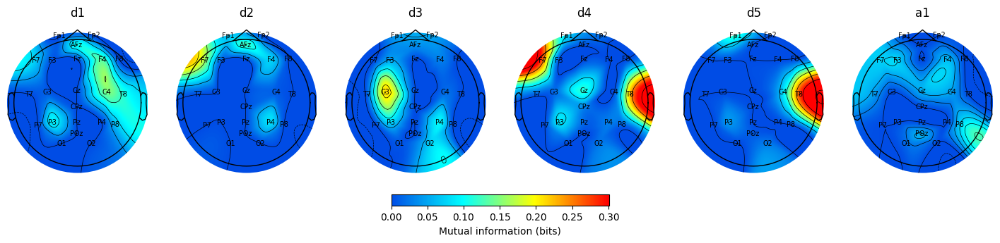

In [15]:
# Loop through IDs
for ID in range(1,35):
    ID = [ID]
    X_train, X_test, y_train, y_test = load_IDs(df, ID, types, mod)
    models, scores = train_all(X_train, y_train)
    y_test_encoded = le.fit_transform(y_test)
    accs,ensemble_preds = calculate_acc(y_test_encoded, models)    
    # Append results to the list
    for i, type_test in enumerate(['KNN', 'RF', 'MLP']):
        df_ids_list.append([
            ID[0],
            type_test,
            scores[i]['test_accuracy'].mean(),
            np.std(scores[i]['test_accuracy']),
            scores[i]['test_precision_macro'].mean(),
            scores[i]['test_recall_macro'].mean(),
            scores[i]['test_f1_macro'].mean(),
            scores[i]['test_roc_auc_ovr'].mean(),
            accs[i]
        ])
    
    # Plot and save topoplot
    fig_name = 'topoplot_' + str(ID[0])
    plot_topoplot(X_train, y_train, info, custom_cmap, save=True, model_name=model_name, fig_name=fig_name)

# Create the DataFrame from the list
df_ids = pd.DataFrame(df_ids_list, columns=['ID', 'test', 'acc', 'test_std','precision', 'recall', 'F1', 'ROC', 'test_acc'])

In [16]:
df_ids

,ID,test,acc,test_std,precision,recall,F1,ROC,test_acc
0,1,KNN,0.340000,0.204695,0.231250,0.300000,0.235000,NaN,0.083333
1,1,RF,0.215000,0.114127,0.129167,0.200000,0.152500,NaN,0.333333
2,1,MLP,0.190000,0.202237,0.109722,0.183333,0.132500,NaN,0.333333
3,2,KNN,0.426190,0.233637,0.363750,0.437500,0.360595,0.679375,0.375000
4,2,RF,0.392857,0.243568,0.397917,0.412500,0.383333,0.732500,0.437500
...,...,...,...,...,...,...,...,...,...
97,33,RF,0.357143,0.176897,0.293750,0.325000,0.288333,0.635208,0.125000
98,33,MLP,0.235714,0.109860,0.181250,0.225000,0.191667,0.545000,0.375000
99,34,KNN,0.247619,0.068346,0.114583,0.237500,0.144048,0.487083,0.125000
100,34,RF,0.269048,0.141682,0.195833,0.275000,0.215000,0.582604,0.312500


### Get best training models and scores 

In [17]:
df = df_ids.copy()
# Find the index of the rows with the highest accuracy for each ID
idx = df.groupby('ID')['acc'].idxmax()

# Use these indices to select the corresponding rows
best_tests = df.loc[idx]
best_tests

,ID,test,acc,test_std,precision,recall,F1,ROC,test_acc
0,1,KNN,0.340000,0.204695,0.231250,0.3000,0.235000,NaN,0.083333
3,2,KNN,0.426190,0.233637,0.363750,0.4375,0.360595,0.679375,0.375000
7,3,RF,0.659524,0.098774,0.635000,0.6500,0.610119,0.849375,0.625000
10,4,RF,0.652381,0.101686,0.600000,0.6750,0.605833,0.900104,0.812500
13,5,RF,0.876667,0.110604,0.804167,0.8625,0.819167,0.956875,0.866667
16,6,RF,0.438095,0.180764,0.362500,0.4500,0.370833,0.797396,0.312500
19,7,RF,0.545238,0.153364,0.479167,0.5250,0.465833,0.843229,0.437500
22,8,RF,0.421429,0.117634,0.387500,0.4250,0.386667,0.717083,0.437500
25,9,RF,0.576190,0.153862,0.479167,0.5750,0.495833,0.747917,0.500000
28,10,RF,0.423810,0.158579,0.360417,0.4125,0.370000,0.658958,0.187500


### Read subjects description

In [18]:
sub_desc = pd.read_csv('/mnt/d/sharegit/MasterThesis_data/participants.tsv', delimiter = '\t')
sub_desc['Subject'] = np.arange(1,35)
sub_desc = sub_desc.rename(columns={"Subject": "ID"})
sub_desc

,ID,Age,Edinburgh Test,Laterality,Gender
0,1,23,23,Right,Male
1,2,21,26,Right,Male
2,3,23,22,Right,Female
3,4,21,21,Right,Female
4,5,23,25,Right,Female
5,6,23,18,Right,Male
6,7,22,20,Right,Female
7,8,20,21,Right,Female
8,9,28,26,Right,Male
9,10,23,18,Right,Male


### Score assessment

In [19]:
def read_ans(filename):
    # Read the content of the answer text file and store it as a list of lines
    with open(filename, 'r') as file:
        answer_lines = file.readlines()
    print(len(answer_lines))
    a = np.zeros((len(answer_lines),4))
    i = 0
    for line in answer_lines:
        a[i, :] = [int(char) for char in line.strip()]  # Convert each character to an integer
        i += 1  # Increment the row index
    da = np.diff(a)
    da[da > 1] = 1
    da[da < 1] = -1
    return [a,da]

def score(filename,a,da):
    # Read the content of the answer text file and store it as a list of lines
    with open(filename, 'r') as file:
        response = file.readlines()
    r = np.zeros((len(response),4))
    i = 0
    for line in response:
        # Split the line by tab characters and convert each part to an integer
        r[i, :] = [int(value) for value in line.strip().split('\t') if value]  
        i += 1  # Increment the row index
    dr = np.diff(r)       
    dr[dr > 1] = 1
    dr[dr < 1] = -1
    r_ex = np.sum(a == r,axis = 1)
    r_chg = np.sum(da == dr,axis = 1)
    return [r_ex,r_chg]


def summary(r_ex,r_chg):
    output = np.zeros((8))
    output[0] = np.sum(r_ex[0:16])
    output[1] = np.sum(r_ex[17:36])
    output[2] = np.sum(r_ex[37:56])
    output[4] = np.sum(r_chg[0:16])
    output[5] = np.sum(r_chg[17:36])
    output[6] = np.sum(r_chg[37:56])
    output[3] = np.sum(r_ex)
    output[7] = np.sum(r_chg)        
    return output

def summary_porcentage(df):
    df['eAir'] = (df['eAir'] / 68) * 100
    df['eVib'] = (df['eVib'] / 80) * 100
    df['eCar'] = (df['eCar'] / 80) * 100
    df['eAll'] = (df['eAll'] / 228) * 100
    df['dAir'] = (df['dAir'] / 51) * 100
    df['dVib'] = (df['dVib'] / 60) * 100
    df['dCar'] = (df['dCar'] / 60) * 100
    df['dAll'] = (df['dAll'] / 171) * 100
    return df

In [20]:
# Main Execution Block
[answers, answers_diffs] = read_ans("/mnt/d/sharegit/MasterThesis_data/NeurosenseDB/PerceivedResponseAnswersheet.txt")

output = []
for folder_sub in range(1, 35):
    [r_ex, r_chg] = score(f"/mnt/d/sharegit/MasterThesis_data/NeurosenseDB/sub-{folder_sub:02d}/other/sub-{folder_sub:02d}_R.tsv", answers, answers_diffs)
    folder_sub = [folder_sub]
    folder_sub.extend(summary(r_ex, r_chg).tolist())  # Use extend to append values to the list
    output.append(folder_sub)

df_scores = pd.DataFrame(output, columns=["ID", "eAir", "eVib", "eCar", "eAll", "dAir", "dVib", "dCar", "dAll"])
df_scores = df_scores[(df != 0).all(axis=1)]
df_scores.reset_index(drop=True, inplace=True)
df_scores = summary_porcentage(df_scores)
df_scores

57


/tmp/ipykernel_180521/3742212303.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_scores = df_scores[(df != 0).all(axis=1)]


,ID,eAir,eVib,eCar,eAll,dAir,dVib,dCar,dAll
0,1,45.588235,75.00,43.75,57.017544,60.784314,86.666667,76.666667,78.362573
1,2,63.235294,83.75,56.25,70.614035,78.431373,86.666667,75.000000,83.625731
2,3,48.529412,87.50,55.00,67.543860,72.549020,93.333333,83.333333,88.304094
3,4,69.117647,87.50,61.25,75.438596,84.313725,95.000000,81.666667,90.058480
4,5,55.882353,87.50,68.75,73.684211,68.627451,91.666667,81.666667,84.210526
5,6,70.588235,82.50,75.00,80.701754,78.431373,91.666667,86.666667,90.643275
6,7,60.294118,77.50,47.50,63.596491,82.352941,85.000000,73.333333,84.210526
7,8,47.058824,85.00,70.00,71.052632,64.705882,90.000000,90.000000,85.380117
8,9,69.117647,92.50,55.00,77.631579,88.235294,95.000000,81.666667,93.567251
9,10,60.294118,87.50,48.75,67.982456,78.431373,93.333333,80.000000,87.134503


In [21]:
df_summary = sub_desc.copy()
df_summary = df_summary.merge(df_scores, left_on='ID', right_on='ID')
df_summary = df_summary.merge(best_tests, left_on='ID', right_on='ID')
df_summary

,ID,Age,Edinburgh Test,Laterality,Gender,eAir,eVib,eCar,eAll,dAir,...,dCar,dAll,test,acc,test_std,precision,recall,F1,ROC,test_acc
0,1,23,23,Right,Male,45.588235,75.00,43.75,57.017544,60.784314,...,76.666667,78.362573,KNN,0.340000,0.204695,0.231250,0.3000,0.235000,NaN,0.083333
1,2,21,26,Right,Male,63.235294,83.75,56.25,70.614035,78.431373,...,75.000000,83.625731,KNN,0.426190,0.233637,0.363750,0.4375,0.360595,0.679375,0.375000
2,3,23,22,Right,Female,48.529412,87.50,55.00,67.543860,72.549020,...,83.333333,88.304094,RF,0.659524,0.098774,0.635000,0.6500,0.610119,0.849375,0.625000
3,4,21,21,Right,Female,69.117647,87.50,61.25,75.438596,84.313725,...,81.666667,90.058480,RF,0.652381,0.101686,0.600000,0.6750,0.605833,0.900104,0.812500
4,5,23,25,Right,Female,55.882353,87.50,68.75,73.684211,68.627451,...,81.666667,84.210526,RF,0.876667,0.110604,0.804167,0.8625,0.819167,0.956875,0.866667
5,6,23,18,Right,Male,70.588235,82.50,75.00,80.701754,78.431373,...,86.666667,90.643275,RF,0.438095,0.180764,0.362500,0.4500,0.370833,0.797396,0.312500
6,7,22,20,Right,Female,60.294118,77.50,47.50,63.596491,82.352941,...,73.333333,84.210526,RF,0.545238,0.153364,0.479167,0.5250,0.465833,0.843229,0.437500
7,8,20,21,Right,Female,47.058824,85.00,70.00,71.052632,64.705882,...,90.000000,85.380117,RF,0.421429,0.117634,0.387500,0.4250,0.386667,0.717083,0.437500
8,9,28,26,Right,Male,69.117647,92.50,55.00,77.631579,88.235294,...,81.666667,93.567251,RF,0.576190,0.153862,0.479167,0.5750,0.495833,0.747917,0.500000
9,10,23,18,Right,Male,60.294118,87.50,48.75,67.982456,78.431373,...,80.000000,87.134503,RF,0.423810,0.158579,0.360417,0.4125,0.370000,0.658958,0.187500


## Correlation

### Correlation between variables

In [22]:
from pandas import factorize

labels, categories = factorize(df_summary["Laterality"])
df_summary["Laterality"] = labels
labels, categories = factorize(df_summary["Gender"])
df_summary["Gender"] = labels
labels, categories = factorize(df_summary["test"])
df_summary["test"] = labels
df_summary = df_summary.drop(['ID','Laterality','test_std','precision','recall','F1','ROC'], axis=1)
df_summary

,Age,Edinburgh Test,Gender,eAir,eVib,eCar,eAll,dAir,dVib,dCar,dAll,test,acc,test_acc
0,23,23,0,45.588235,75.00,43.75,57.017544,60.784314,86.666667,76.666667,78.362573,0,0.340000,0.083333
1,21,26,0,63.235294,83.75,56.25,70.614035,78.431373,86.666667,75.000000,83.625731,0,0.426190,0.375000
2,23,22,1,48.529412,87.50,55.00,67.543860,72.549020,93.333333,83.333333,88.304094,1,0.659524,0.625000
3,21,21,1,69.117647,87.50,61.25,75.438596,84.313725,95.000000,81.666667,90.058480,1,0.652381,0.812500
4,23,25,1,55.882353,87.50,68.75,73.684211,68.627451,91.666667,81.666667,84.210526,1,0.876667,0.866667
5,23,18,0,70.588235,82.50,75.00,80.701754,78.431373,91.666667,86.666667,90.643275,1,0.438095,0.312500
6,22,20,1,60.294118,77.50,47.50,63.596491,82.352941,85.000000,73.333333,84.210526,1,0.545238,0.437500
7,20,21,1,47.058824,85.00,70.00,71.052632,64.705882,90.000000,90.000000,85.380117,1,0.421429,0.437500
8,28,26,0,69.117647,92.50,55.00,77.631579,88.235294,95.000000,81.666667,93.567251,1,0.576190,0.500000
9,23,18,0,60.294118,87.50,48.75,67.982456,78.431373,93.333333,80.000000,87.134503,1,0.423810,0.187500


In [23]:
df_summary.describe()

,Age,Edinburgh Test,Gender,eAir,eVib,eCar,eAll,dAir,dVib,dCar,dAll,test,acc,test_acc
count,34.000000,34.000000,34.000000,34.000000,34.000000,34.000000,34.000000,34.000000,34.000000,34.000000,34.000000,34.000000,34.000000,34.000000
mean,22.882353,20.794118,0.558824,64.359862,83.014706,61.029412,73.361713,80.219146,88.676471,81.813725,88.028896,1.117647,0.521373,0.472006
std,1.409163,2.992712,0.503995,13.317032,9.687922,10.613164,8.070225,8.558680,6.689096,6.374503,4.837869,0.537373,0.197291,0.272121
min,20.000000,15.000000,0.000000,35.294118,40.000000,35.000000,56.140351,60.784314,60.000000,63.333333,77.192982,0.000000,0.235714,0.062500
25%,23.000000,18.500000,0.000000,55.882353,77.812500,55.000000,67.543860,73.529412,86.666667,77.083333,84.356725,1.000000,0.360714,0.312500
50%,23.000000,20.500000,1.000000,66.176471,85.000000,61.250000,75.000000,82.352941,90.833333,81.666667,88.596491,1.000000,0.445238,0.437500
75%,23.000000,23.000000,1.000000,74.632353,87.500000,68.750000,79.276316,86.274510,92.916667,86.666667,91.520468,1.000000,0.627976,0.625000
max,28.000000,26.000000,1.000000,88.235294,95.000000,85.000000,86.403509,92.156863,95.000000,91.666667,96.491228,2.000000,1.000000,1.000000


In [24]:
corr = df_summary.corr(method ='kendall')
mask = np.triu(np.ones_like(corr, dtype=bool))

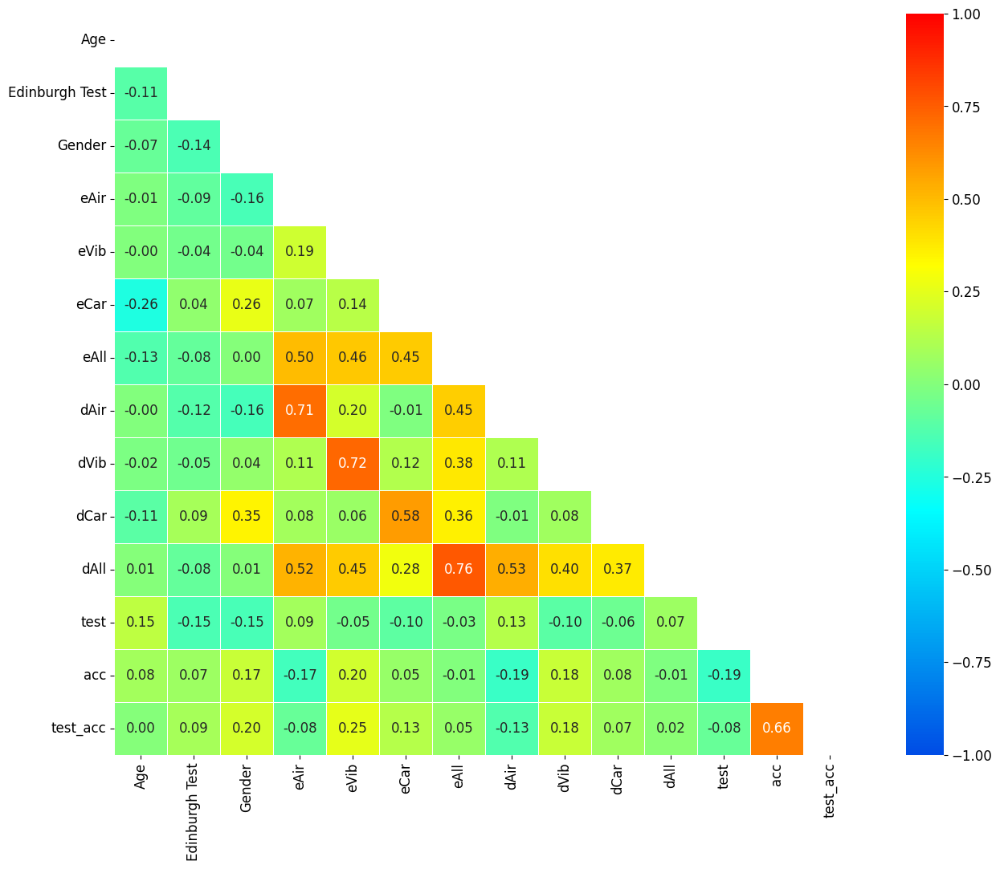

In [25]:
# Create a masked heatmap
plt.figure(figsize = (16,12))
plt.rcParams.update({'font.size': 12})
sns.heatmap(corr, cmap = custom_cmap, vmin = -1, vmax = 1, center = 0, annot=True, fmt=".2f", square=True, linewidths=.5, mask = mask)
plt.show()

## Statistical analysis

In [26]:
import statsmodels.api as sm
import pandas as pd

# Assuming df is your DataFrame and 'x' and 'y' are your variables
X = df_summary['Gender']
Y = df_summary['acc']

# Adding a constant to the model (intercept)
X = sm.add_constant(X)

# Fitting the model
model = sm.OLS(Y, X).fit()

# Getting the summary of the model
summary = model.summary()
print(summary)

                            OLS Regression Results                            
Dep. Variable:                    acc   R-squared:                       0.017
Model:                            OLS   Adj. R-squared:                 -0.014
Method:                 Least Squares   F-statistic:                    0.5544
Date:                Thu, 20 Jun 2024   Prob (F-statistic):              0.462
Time:                        02:09:42   Log-Likelihood:                 7.7402
No. Observations:                  34   AIC:                            -11.48
Df Residuals:                      32   BIC:                            -8.428
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4928      0.051      9.609      0.0

In [27]:
# Assuming df is your DataFrame and 'x' and 'y' are your variables
X = df_summary['Gender']
Y = df_summary['dCar']

# Adding a constant to the model (intercept)
X = sm.add_constant(X)

# Fitting the model
model = sm.OLS(Y, X).fit()

# Getting the summary of the model
summary = model.summary()
print(summary)

                            OLS Regression Results                            
Dep. Variable:                   dCar   R-squared:                       0.158
Model:                            OLS   Adj. R-squared:                  0.132
Method:                 Least Squares   F-statistic:                     6.026
Date:                Thu, 20 Jun 2024   Prob (F-statistic):             0.0197
Time:                        02:09:42   Log-Likelihood:                -107.78
No. Observations:                  34   AIC:                             219.6
Df Residuals:                      32   BIC:                             222.6
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         79.0000      1.533     51.524      0.0

In [28]:
# Assuming df is your DataFrame and 'x' and 'y' are your variables
X = df_summary['Gender']
Y = df_summary['dAir']

# Adding a constant to the model (intercept)
X = sm.add_constant(X)

# Fitting the model
model = sm.OLS(Y, X).fit()

# Getting the summary of the model
summary = model.summary()
print(summary)

                            OLS Regression Results                            
Dep. Variable:                   dAir   R-squared:                       0.024
Model:                            OLS   Adj. R-squared:                 -0.006
Method:                 Least Squares   F-statistic:                    0.7980
Date:                Thu, 20 Jun 2024   Prob (F-statistic):              0.378
Time:                        02:09:42   Log-Likelihood:                -120.31
No. Observations:                  34   AIC:                             244.6
Df Residuals:                      32   BIC:                             247.7
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         81.6993      2.217     36.857      0.0

In [29]:
# Assuming df is your DataFrame and 'x' and 'y' are your variables
X = df_summary['dCar']
Y = df_summary['acc']

# Adding a constant to the model (intercept)
X = sm.add_constant(X)

# Fitting the model
model = sm.OLS(Y, X).fit()

# Getting the summary of the model
summary = model.summary()
print(summary)

                            OLS Regression Results                            
Dep. Variable:                    acc   R-squared:                       0.007
Model:                            OLS   Adj. R-squared:                 -0.024
Method:                 Least Squares   F-statistic:                    0.2377
Date:                Thu, 20 Jun 2024   Prob (F-statistic):              0.629
Time:                        02:09:42   Log-Likelihood:                 7.5740
No. Observations:                  34   AIC:                            -11.15
Df Residuals:                      32   BIC:                            -8.095
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.3039      0.447      0.680      0.5